In [ ]:
# Import required libraries
import numpy as np
import pandas as pd
import missingno as msno
import json

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium

from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

# **Data :- 1**

### **1) Data Collection**</br>
 * **Type :-** CSV formate
 * **Source :-** [Wikipedia](https://en.wikipedia.org/wiki/List_of_Indian_states_and_union_territories_by_GDP)
 * **Method :-** web scraping

In [ ]:
# Import Dataset
missing_value = ["\u2013"] # In our data non-value is fill by (-)

df_value = pd.read_csv('INDIA_GDP.csv', na_values = missing_value) # In this CSV, GDP is in value
df_per = pd.read_csv('INDIA_GDP_per.csv', na_values = missing_value) # In this CSV, GDP is in percentage

### **2) Understand Data** 

*GDP : Gross domestic product*

*GSDP : Gross state domestic product*

In [ ]:
# see colmuns of datasets
df_value.columns

Index(['State/union territory', '2011–12  in ₹ crore', '2012–13  in ₹ crore',
       '2013–14  in ₹ crore', '2014–15  in ₹ crore', '2015–16  in ₹ crore',
       '2016–17  in ₹ crore', '2017–18  in ₹ crore', '2018–19  in ₹ crore',
       '2019–20  in ₹ crore', '2020–21  in ₹ crore'],
      dtype='object')

In [ ]:
df_per.columns

Index(['State/union territory', '2010–11', '2011–12', '2012–13', '2013–14',
       '2014–15', '2015–16', '2016–17', '2017–18', '2018–19'],
      dtype='object')

In above Datasets, **State/union territory** is **different states of INDIA & territory** and other are year wise GDP in **value and Growth Rate(%)** .

So, **State/union territory** is **Categorical** and others are **Numerical** 

In [ ]:
# Basic information of datasets
df_value.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34 entries, 0 to 33
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   State/union territory  34 non-null     object 
 1   2011–12  in ₹ crore    34 non-null     int64  
 2   2012–13  in ₹ crore    34 non-null     int64  
 3   2013–14  in ₹ crore    34 non-null     int64  
 4   2014–15  in ₹ crore    34 non-null     int64  
 5   2015–16  in ₹ crore    34 non-null     int64  
 6   2016–17  in ₹ crore    34 non-null     int64  
 7   2017–18  in ₹ crore    34 non-null     int64  
 8   2018–19  in ₹ crore    25 non-null     float64
 9   2019–20  in ₹ crore    20 non-null     float64
 10  2020–21  in ₹ crore    11 non-null     object 
dtypes: float64(2), int64(7), object(2)
memory usage: 3.0+ KB


In [ ]:
df_per.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34 entries, 0 to 33
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   State/union territory  34 non-null     object 
 1   2010–11                34 non-null     float64
 2   2011–12                34 non-null     float64
 3   2012–13                34 non-null     object 
 4   2013–14                34 non-null     object 
 5   2014–15                34 non-null     float64
 6   2015–16                34 non-null     object 
 7   2016–17                34 non-null     float64
 8   2017–18                23 non-null     float64
 9   2018–19                14 non-null     float64
dtypes: float64(6), object(4)
memory usage: 2.8+ KB


In [ ]:
# No of rows and columns in datasets
print(df_value.shape)
print(df_per.shape)

(34, 11)
(34, 10)


In [ ]:
# See first 5 rows of datasets
df_value.head()

,State/union territory,2011–12 in ₹ crore,2012–13 in ₹ crore,2013–14 in ₹ crore,2014–15 in ₹ crore,2015–16 in ₹ crore,2016–17 in ₹ crore,2017–18 in ₹ crore,2018–19 in ₹ crore,2019–20 in ₹ crore,2020–21 in ₹ crore
0,India,8736039,9946636,11236635,12433749,13675331,15251028,17095005,19010164.0,NaN,NaN
1,Andhra Pradesh,379402,411404,464272,524976,604229,697508,809547,933402.0,1080657.0,NaN
2,Arunachal Pradesh,11063,12547,14581,17959,18509,19627,22045,NaN,NaN,NaN
3,Assam,143175,156864,177745,195723,227959,254478,288494,332939.0,374096.0,408627
4,Bihar,247144,282368,317101,342951,371602,422316,484740,557490.0,572827.0,NaN


In [ ]:
df_per.head()

,State/union territory,2010–11,2011–12,2012–13,2013–14,2014–15,2015–16,2016–17,2017–18,2018–19
0,India,18.66,15.77,13.80,13.0,11.0,10.4,10.8,10.00,11.20
1,Andhra Pradesh,17.03,13.25,13.20,12.90,13.4,15.90,14.7,16.06,15.23
2,Arunachal Pradesh,20.59,17.82,13.86,16.20,23.2,3.3,9.2,NaN,NaN
3,Assam,17.41,11.65,9.60,13.30,10.1,16.50,11.6,NaN,NaN
4,Bihar,25.39,21.06,14.30,12.30,8.2,7.70,15.3,14.50,NaN


In [ ]:
# A quick stattistical view
df_value.describe()

,2011–12 in ₹ crore,2012–13 in ₹ crore,2013–14 in ₹ crore,2014–15 in ₹ crore,2015–16 in ₹ crore,2016–17 in ₹ crore,2017–18 in ₹ crore,2018–19 in ₹ crore,2019–20 in ₹ crore
count,3.400000e+01,3.400000e+01,3.400000e+01,3.400000e+01,3.400000e+01,3.400000e+01,3.400000e+01,2.500000e+01,2.000000e+01
mean,5.108109e+05,5.815649e+05,6.584401e+05,7.256438e+05,8.020311e+05,8.979841e+05,1.007224e+06,1.517908e+06,9.934373e+05
std,1.480947e+06,1.686436e+06,1.905306e+06,2.107743e+06,2.318607e+06,2.585308e+06,2.896987e+06,3.697143e+06,7.021565e+05
min,3.978000e+03,4.421000e+03,5.023000e+03,5.477000e+03,6.032000e+03,6.836000e+03,7.871000e+03,2.678600e+04,1.689720e+05
25%,1.938550e+04,2.171525e+04,2.501475e+04,2.729500e+04,3.094450e+04,3.445875e+04,4.063775e+04,3.116600e+05,4.991330e+05
50%,1.945305e+05,2.196055e+05,2.516540e+05,2.676840e+05,2.782545e+05,3.242650e+05,3.624340e+05,7.796520e+05,8.531930e+05
75%,3.755635e+05,4.120858e+05,4.648488e+05,5.218730e+05,5.976472e+05,6.878892e+05,7.956130e+05,1.177586e+06,1.382972e+06
max,8.736039e+06,9.946636e+06,1.123664e+07,1.243375e+07,1.367533e+07,1.525103e+07,1.709500e+07,1.901016e+07,2.979556e+06


In [ ]:
df_per.describe()

,2010–11,2011–12,2014–15,2016–17,2017–18,2018–19
count,34.000000,34.000000,34.000000,34.000000,23.000000,14.000000
mean,17.909412,14.085294,10.890882,11.749412,11.480435,12.830000
std,5.344145,3.062566,6.679465,2.660418,2.054652,3.247529
min,5.460000,7.200000,1.300000,7.900000,8.100000,7.200000
25%,14.862500,12.345000,7.225000,9.900000,10.035000,11.050000
50%,18.035000,13.305000,9.800000,11.150000,11.130000,11.710000
75%,20.952500,16.170000,11.775000,13.750000,12.620000,14.797500
max,29.780000,21.060000,33.100000,19.300000,16.060000,18.910000


### **3) Restructuring data**


In [ ]:
df_value.columns

Index(['State/union territory', '2011–12  in ₹ crore', '2012–13  in ₹ crore',
       '2013–14  in ₹ crore', '2014–15  in ₹ crore', '2015–16  in ₹ crore',
       '2016–17  in ₹ crore', '2017–18  in ₹ crore', '2018–19  in ₹ crore',
       '2019–20  in ₹ crore', '2020–21  in ₹ crore'],
      dtype='object')

In [ ]:
df_per.columns

Index(['State/union territory', '2010–11', '2011–12', '2012–13', '2013–14',
       '2014–15', '2015–16', '2016–17', '2017–18', '2018–19'],
      dtype='object')

In [ ]:
# Rename the columns
df_value.columns = df_value.columns.str.replace("\u2013","-")
cols = df_value.columns
df_value.rename(columns={cols[0] : 'state/union_territory'}, inplace=True)
for col in cols[1:]:
    df_value.rename(columns={ col : col.split()[0] + '(in_₹_crore)'}, inplace=True)

In [ ]:
df_per.columns = df_per.columns.str.replace("\u2013","-")
cols = df_per.columns
df_per.rename(columns={cols[0] : 'state/union_territory'}, inplace=True)
for col in cols[1:]:
    df_per.rename(columns={ col : col.split()[0] + '(in_per)'}, inplace=True)

In [ ]:
df_value.columns

Index(['state/union_territory', '2011-12(in_₹_crore)', '2012-13(in_₹_crore)',
       '2013-14(in_₹_crore)', '2014-15(in_₹_crore)', '2015-16(in_₹_crore)',
       '2016-17(in_₹_crore)', '2017-18(in_₹_crore)', '2018-19(in_₹_crore)',
       '2019-20(in_₹_crore)', '2020-21(in_₹_crore)'],
      dtype='object')

In [ ]:
df_per.columns

Index(['state/union_territory', '2010-11(in_per)', '2011-12(in_per)',
       '2012-13(in_per)', '2013-14(in_per)', '2014-15(in_per)',
       '2015-16(in_per)', '2016-17(in_per)', '2017-18(in_per)',
       '2018-19(in_per)'],
      dtype='object')

Here, We can see that in the **df_value** years are starting to **2011-12** and ending to **2020-21**. But in **df_per** from **2010-11** to **2018-19**. </br>
So, we will fix it.

In [ ]:
df_value.drop(['2019-20(in_₹_crore)','2020-21(in_₹_crore)'], axis=1 , inplace=True)
df_per.drop(['2010-11(in_per)'], axis=1, inplace=True)

In [ ]:
df_value.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34 entries, 0 to 33
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   state/union_territory  34 non-null     object 
 1   2011-12(in_₹_crore)    34 non-null     int64  
 2   2012-13(in_₹_crore)    34 non-null     int64  
 3   2013-14(in_₹_crore)    34 non-null     int64  
 4   2014-15(in_₹_crore)    34 non-null     int64  
 5   2015-16(in_₹_crore)    34 non-null     int64  
 6   2016-17(in_₹_crore)    34 non-null     int64  
 7   2017-18(in_₹_crore)    34 non-null     int64  
 8   2018-19(in_₹_crore)    25 non-null     float64
dtypes: float64(1), int64(7), object(1)
memory usage: 2.5+ KB


In [ ]:
df_per.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34 entries, 0 to 33
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   state/union_territory  34 non-null     object 
 1   2011-12(in_per)        34 non-null     float64
 2   2012-13(in_per)        34 non-null     object 
 3   2013-14(in_per)        34 non-null     object 
 4   2014-15(in_per)        34 non-null     float64
 5   2015-16(in_per)        34 non-null     object 
 6   2016-17(in_per)        34 non-null     float64
 7   2017-18(in_per)        23 non-null     float64
 8   2018-19(in_per)        14 non-null     float64
dtypes: float64(5), object(4)
memory usage: 2.5+ KB


In [ ]:
df_per['2012-13(in_per)'][6] = -10.0
df_per['2013-14(in_per)'][6] = -5.0

In [ ]:
# Convert to appropriate data type
for i in df_value.columns[1:]:
    df_value[i] = pd.to_numeric(df_value[i], errors='coerce', downcast='float')
for i in df_per.columns[1:]:
    df_per[i] = pd.to_numeric(df_per[i], errors='coerce', downcast='float')

In [ ]:
df_value.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34 entries, 0 to 33
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   state/union_territory  34 non-null     object 
 1   2011-12(in_₹_crore)    34 non-null     float32
 2   2012-13(in_₹_crore)    34 non-null     float32
 3   2013-14(in_₹_crore)    34 non-null     float32
 4   2014-15(in_₹_crore)    34 non-null     float32
 5   2015-16(in_₹_crore)    34 non-null     float32
 6   2016-17(in_₹_crore)    34 non-null     float32
 7   2017-18(in_₹_crore)    34 non-null     float64
 8   2018-19(in_₹_crore)    25 non-null     float32
dtypes: float32(7), float64(1), object(1)
memory usage: 1.6+ KB


In [ ]:
df_per.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34 entries, 0 to 33
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   state/union_territory  34 non-null     object 
 1   2011-12(in_per)        34 non-null     float32
 2   2012-13(in_per)        34 non-null     float32
 3   2013-14(in_per)        34 non-null     float32
 4   2014-15(in_per)        34 non-null     float32
 5   2015-16(in_per)        33 non-null     float32
 6   2016-17(in_per)        34 non-null     float32
 7   2017-18(in_per)        23 non-null     float32
 8   2018-19(in_per)        14 non-null     float32
dtypes: float32(8), object(1)
memory usage: 1.5+ KB


### **4) Data Cleaning**

In [ ]:
df1_value = df_value.copy()
df1_per = df_per.copy()

In [ ]:
# Check how many null values
df1_value.isna().sum()

state/union_territory    0
2011-12(in_₹_crore)      0
2012-13(in_₹_crore)      0
2013-14(in_₹_crore)      0
2014-15(in_₹_crore)      0
2015-16(in_₹_crore)      0
2016-17(in_₹_crore)      0
2017-18(in_₹_crore)      0
2018-19(in_₹_crore)      9
dtype: int64

In [ ]:
df1_per.isna().sum()

state/union_territory     0
2011-12(in_per)           0
2012-13(in_per)           0
2013-14(in_per)           0
2014-15(in_per)           0
2015-16(in_per)           1
2016-17(in_per)           0
2017-18(in_per)          11
2018-19(in_per)          20
dtype: int64

<Axes: >

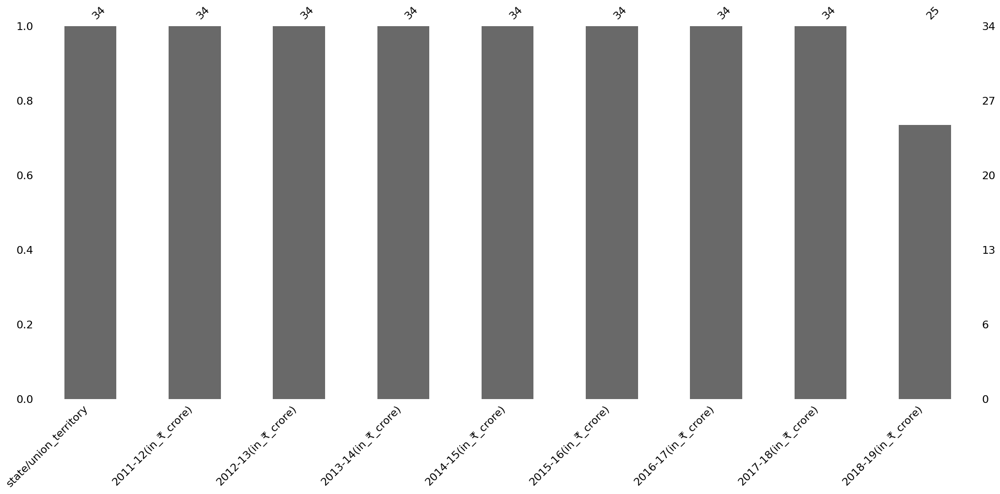

In [ ]:
#graphical analysis of missing values
msno.bar(df1_value)   

<Axes: >

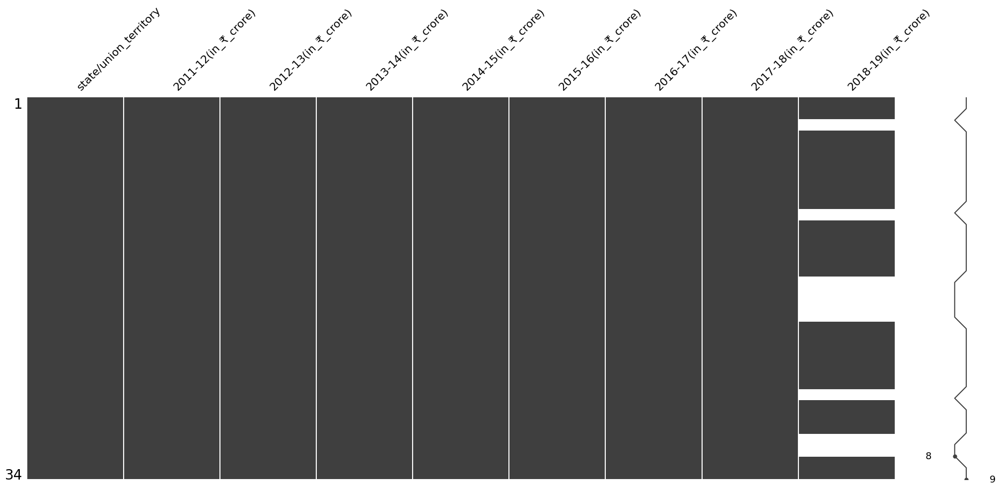

In [ ]:
#matrix for of missing data
msno.matrix(df1_value)

<Axes: >

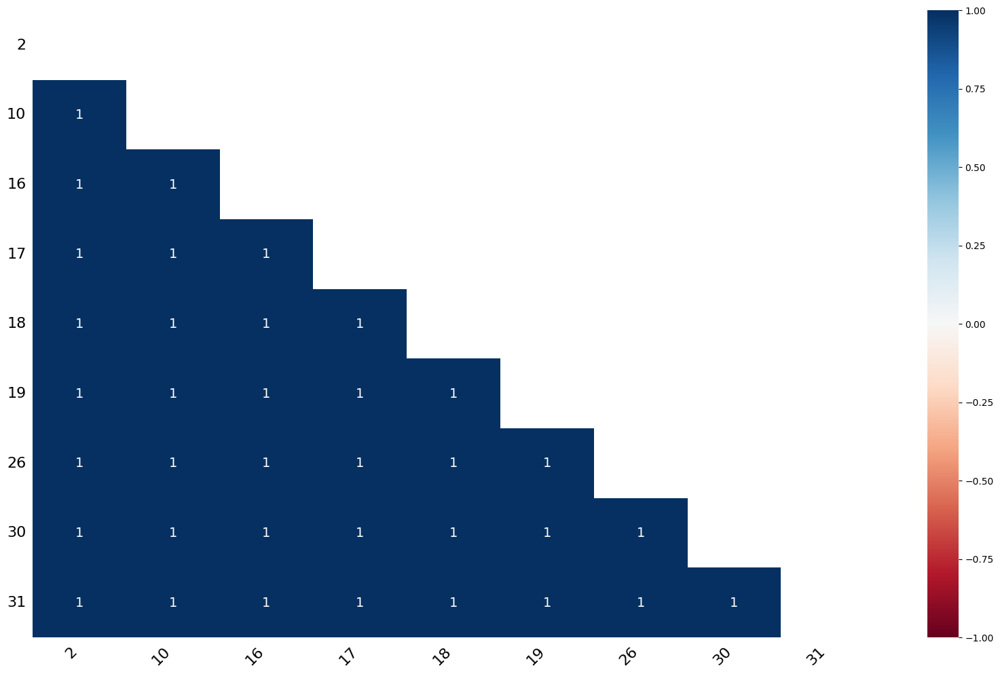

In [ ]:
#Finding reasson for missing data using Heatmap
msno.heatmap(df1_value.T)

The heatmap function shows that there are strong correlations between missing values of different variables.

High correlations further indicate that the data are MCAR(Missing Completely At Random).

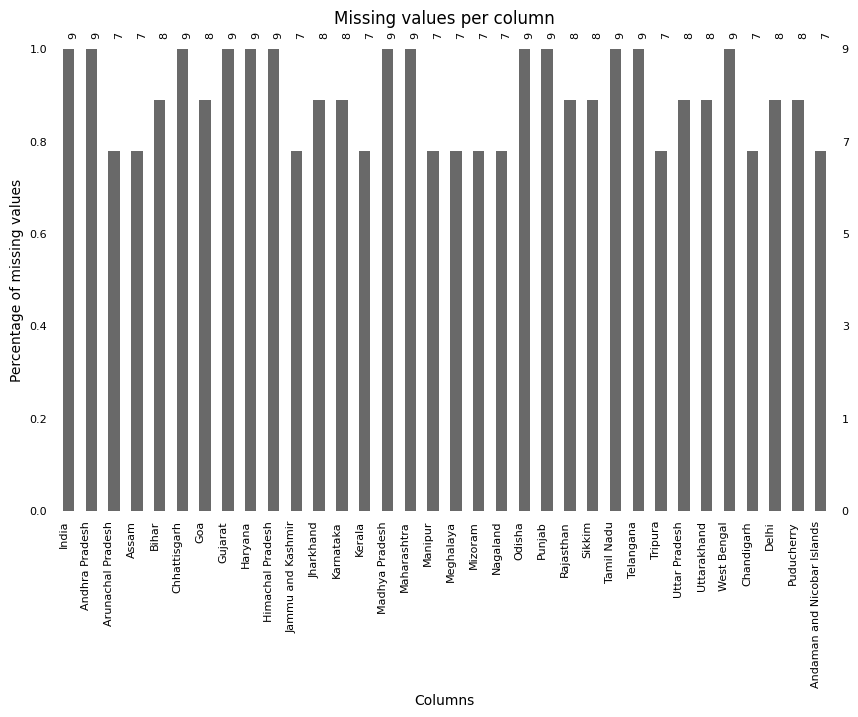

In [ ]:
a = df1_per.T.copy()
a.columns = a.iloc[0]
fig, ax = plt.subplots(figsize=(10, 6))
msno.bar(a, ax=ax, labels=a.columns.tolist(), label_rotation=90, fontsize=8)
ax.set_xlabel('Columns')
ax.set_ylabel('Percentage of missing values')
ax.set_title('Missing values per column')
plt.show()

<Axes: >

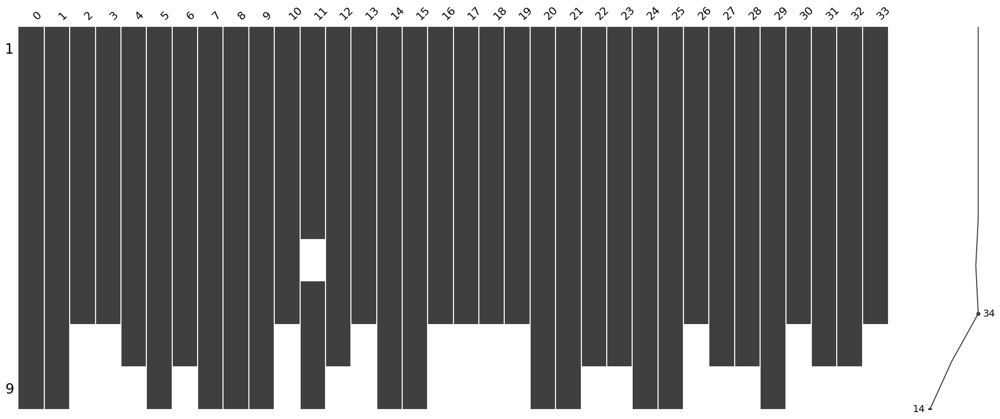

In [ ]:
msno.matrix(df1_per.T)

<Axes: >

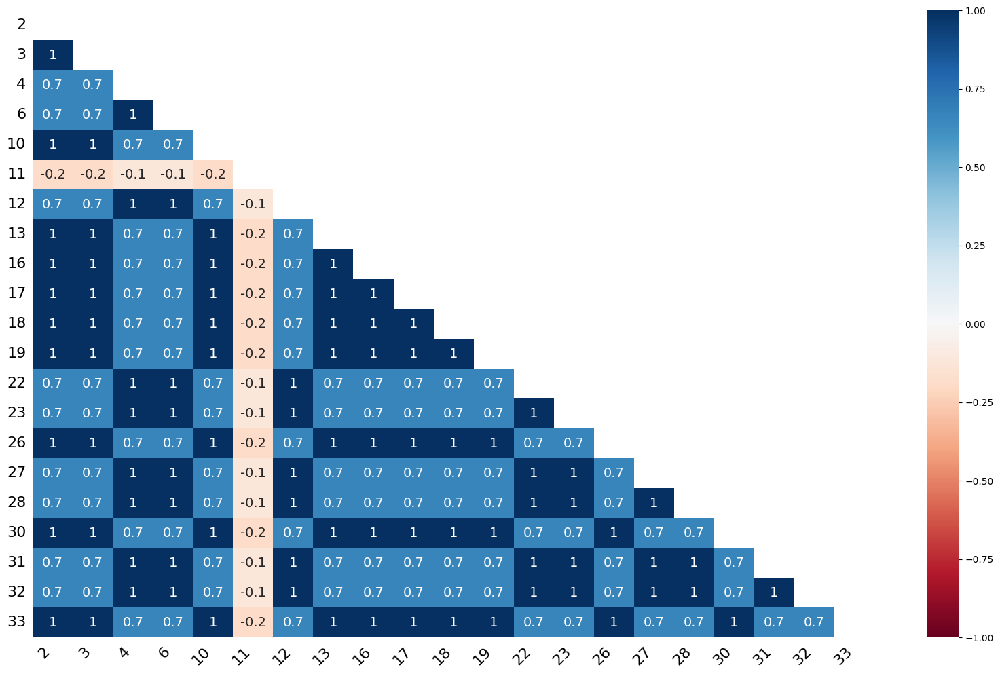

In [ ]:
msno.heatmap(df1_per.T)

In [ ]:
df1_value.isna().sum()

state/union_territory    0
2011-12(in_₹_crore)      0
2012-13(in_₹_crore)      0
2013-14(in_₹_crore)      0
2014-15(in_₹_crore)      0
2015-16(in_₹_crore)      0
2016-17(in_₹_crore)      0
2017-18(in_₹_crore)      0
2018-19(in_₹_crore)      9
dtype: int64

In [ ]:
# subset of datafreame which has null value.
df1_value[df1_value.isnull().any(axis=1)]

,state/union_territory,2011-12(in_₹_crore),2012-13(in_₹_crore),2013-14(in_₹_crore),2014-15(in_₹_crore),2015-16(in_₹_crore),2016-17(in_₹_crore),2017-18(in_₹_crore),2018-19(in_₹_crore)
2,Arunachal Pradesh,11063.0,12547.0,14581.0,17959.0,18509.0,19627.0,22045.0,NaN
10,Jammu and Kashmir,78256.0,87138.0,95619.0,98370.0,117168.0,125379.0,138488.0,NaN
16,Manipur,12915.0,13743.0,16182.0,18129.0,19531.0,21294.0,23968.0,NaN
17,Meghalaya,19918.0,21872.0,22938.0,23235.0,25117.0,27439.0,30790.0,NaN
18,Mizoram,7259.0,8362.0,10293.0,13509.0,15139.0,17192.0,19457.0,NaN
19,Nagaland,12177.0,14121.0,16612.0,18401.0,19524.0,21722.0,24281.0,NaN
26,Tripura,19208.0,21663.0,25593.0,29533.0,35938.0,39612.0,46133.0,NaN
30,Andaman and Nicobar Islands,3978.0,4421.0,5023.0,5477.0,6032.0,6836.0,7871.0,NaN
31,Chandigarh,18768.0,21609.0,24822.0,26549.0,29280.0,32741.0,38806.0,NaN


In [ ]:
df1_per[df1_per.isnull().any(axis=1)]

,state/union_territory,2011-12(in_per),2012-13(in_per),2013-14(in_per),2014-15(in_per),2015-16(in_per),2016-17(in_per),2017-18(in_per),2018-19(in_per)
2,Arunachal Pradesh,17.820000,13.86,16.200001,23.200001,3.300000,9.200000,NaN,NaN
3,Assam,11.650000,9.60,13.300000,10.100000,16.500000,11.600000,NaN,NaN
4,Bihar,21.059999,14.30,12.300000,8.200000,7.700000,15.300000,14.50,NaN
6,Goa,7.200000,-10.00,-5.000000,33.099998,15.100000,13.800000,9.47,NaN
10,Jammu and Kashmir,13.240000,11.40,9.700000,2.900000,19.100000,8.200000,NaN,NaN
11,Jharkhand,13.050000,15.80,7.900000,15.900000,NaN,14.000000,8.40,7.2
12,Karnataka,10.800000,14.80,17.400000,11.800000,11.000000,11.800000,12.10,NaN
13,Kerala,16.730000,13.30,12.800000,10.200000,9.600000,10.700000,NaN,NaN
16,Manipur,14.960000,6.40,17.700001,12.000000,7.700000,7.900000,NaN,NaN
17,Meghalaya,12.540000,9.80,4.900000,1.300000,8.100000,8.400000,NaN,NaN


Some Missing values in df1_per dataframe Which can be derived from previous year GSDP 

 \begin{align}
        Per = \frac{ Current \ year \ GSDP - Previous \ Year \ GSDP}{Previous \ Year \ GSDP} * 100
    \end{align}

In [ ]:
df1_per.loc[6,'2012-13(in_per)'] = round(((38120-42367)/42367)*100,2)
df1_per.loc[6,'2013-14(in_per)'] = round(((35921-38120)/38120)*100 ,2)
df1_per.loc[11,'2015-16(in_per)'] = round(((206613-218525)/218525)*100 ,2)	

In [ ]:
df2_value = df1_value.copy()
df2_per = df1_per.copy()

**Use KNN Imputer to impute null values**

In [ ]:
temp = df2_value.iloc[:,1:].T 

imputer = KNNImputer()
imputer.fit(temp)

new_value = imputer.transform(temp)
temp2 = pd.DataFrame(new_value, columns = temp.columns)

df2_value.iloc[:,1:] = temp2.T

In [ ]:
df2_value.isna().sum().sum()

0

In [ ]:
temp = df2_per.iloc[:,1:].T 

imputer = KNNImputer()
imputer.fit(temp)

new_value = imputer.transform(temp)
temp2 = pd.DataFrame(new_value, columns = temp.columns)

df2_per.iloc[:,1:] = temp2.T

In [ ]:
df2_per.isna().sum().sum()

0

### **5) Data Visualization**

###### **Inda GDP growth**

In [ ]:
india_gdp = np.array(df2_value.iloc[0,1:])

In [ ]:
Years = ['2011-12','2012-13', '2013-14', '2014-15', '2015-16', '2016-17', '2017-18', '2018-19']

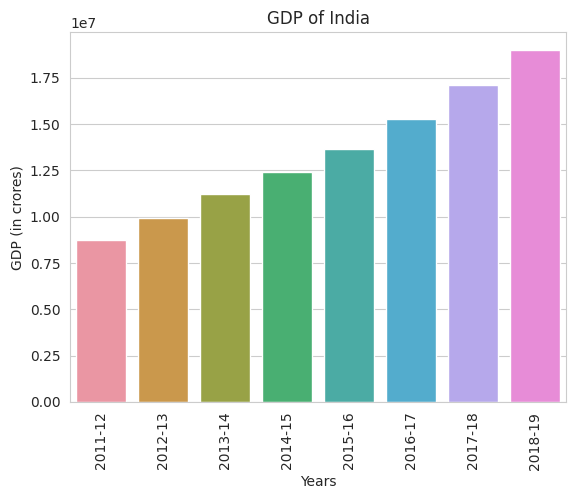

In [ ]:
sns.set_style("whitegrid")
sns.set_palette("PuBuGn")
sns.barplot(x=Years, y=india_gdp)

plt.xticks(rotation=90)
plt.xlabel("Years")
plt.ylabel("GDP (in crores)")
plt.title("GDP of India")
plt.show()

##### **Bar charts**

In [ ]:
df3_value = df2_value.iloc[1:,:]
df3_per = df2_per.iloc[1:,:]

In [ ]:
value_col = df3_value.columns
per_col = df3_per.columns

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


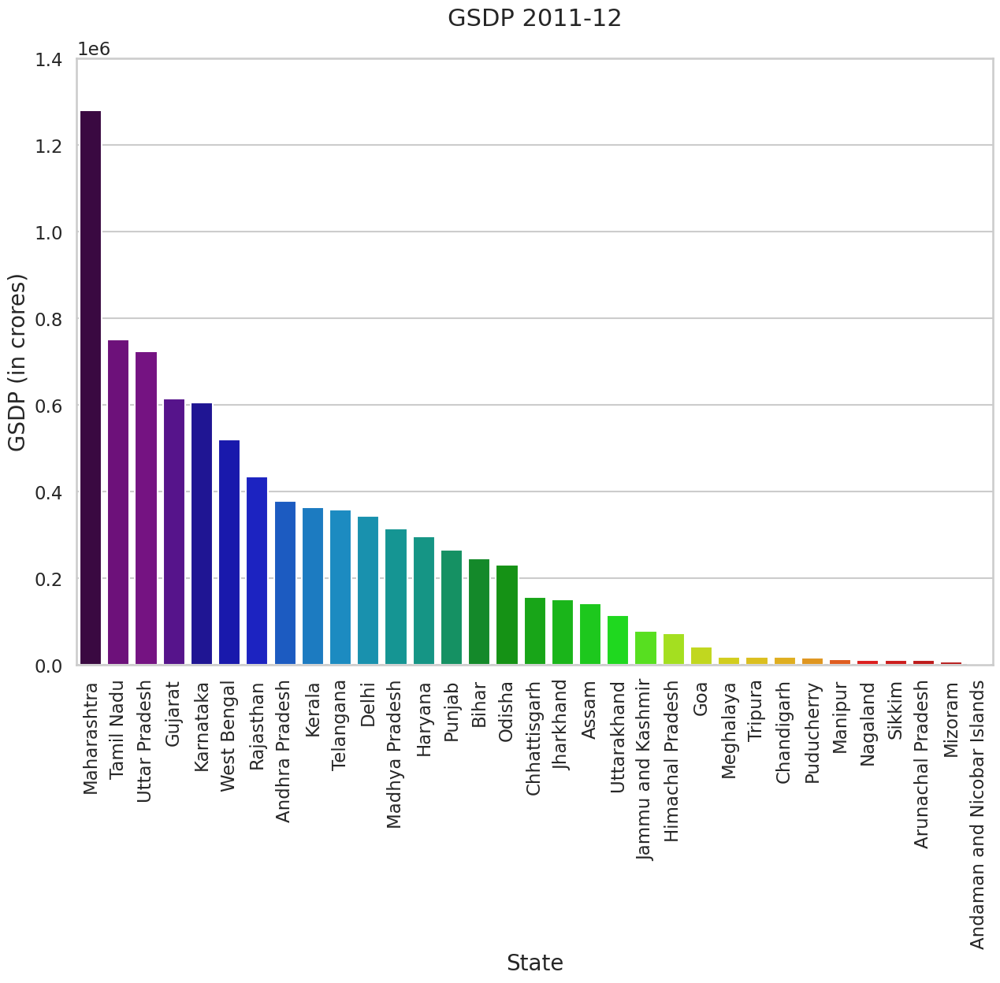

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


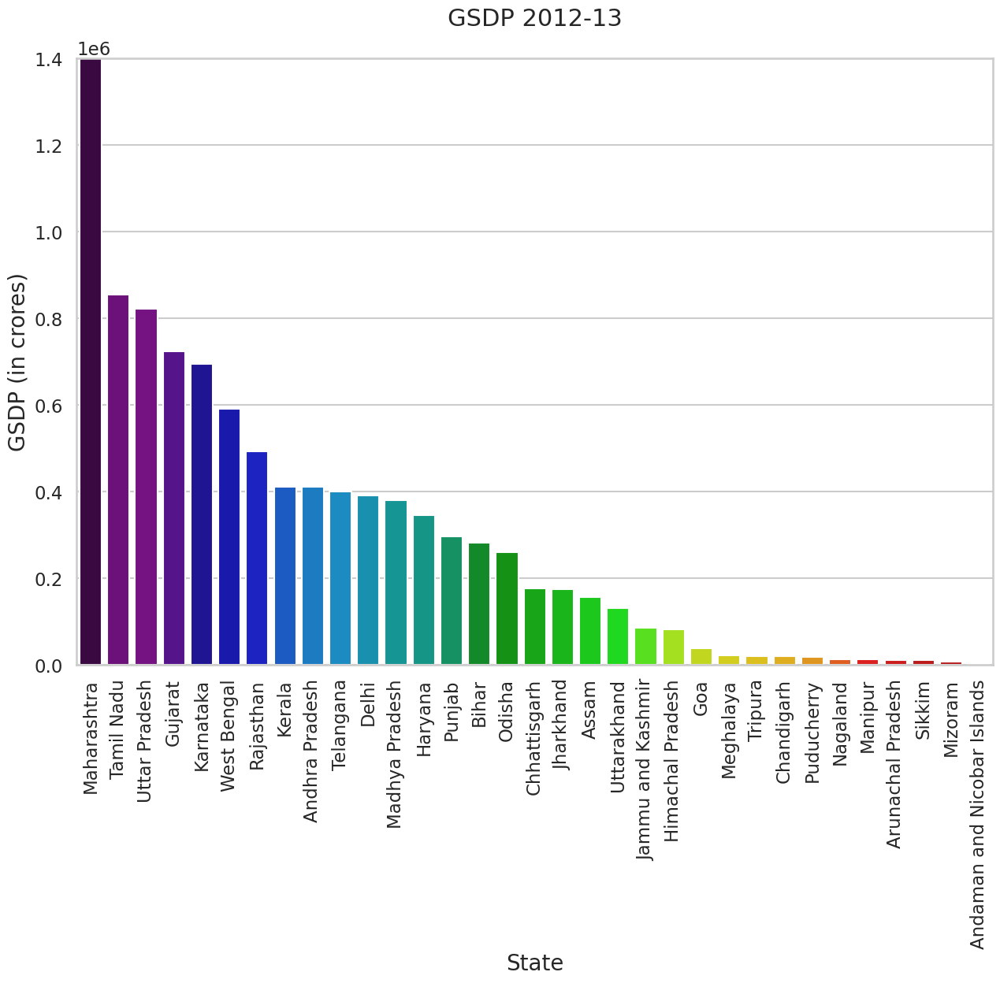

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


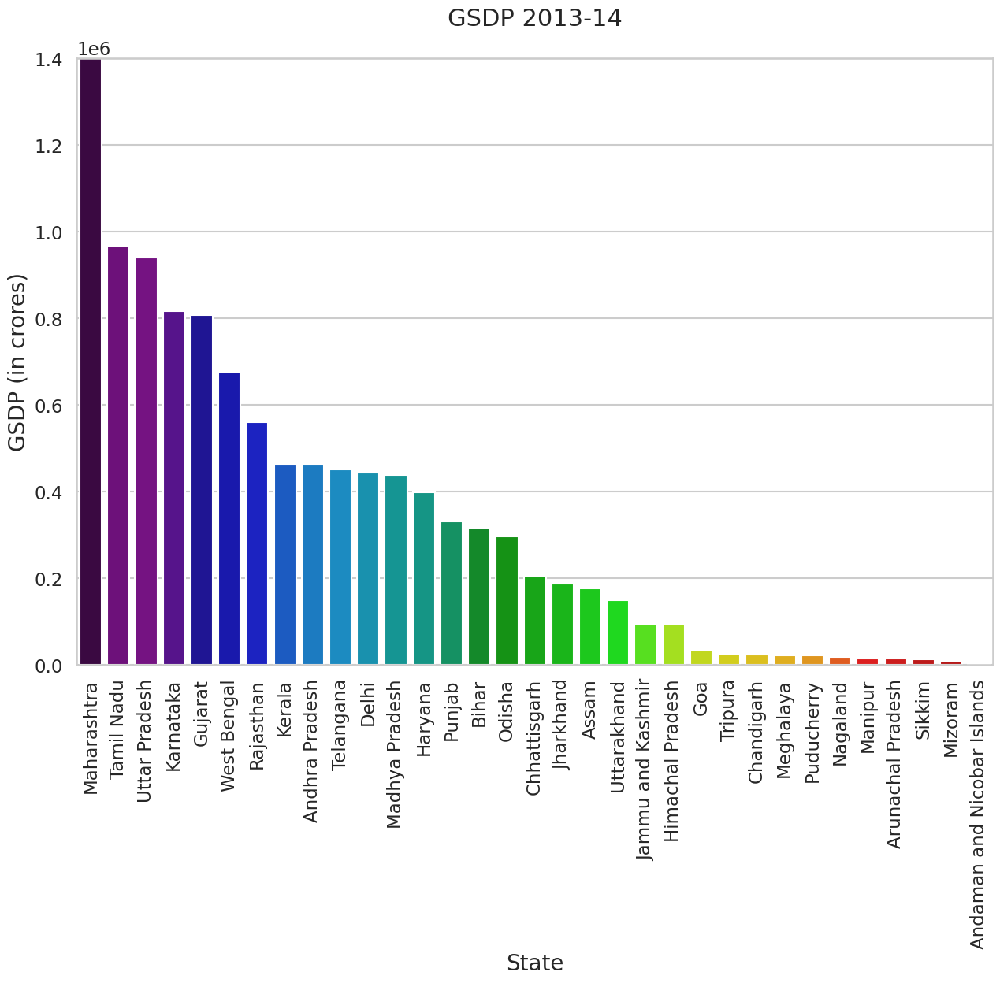

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


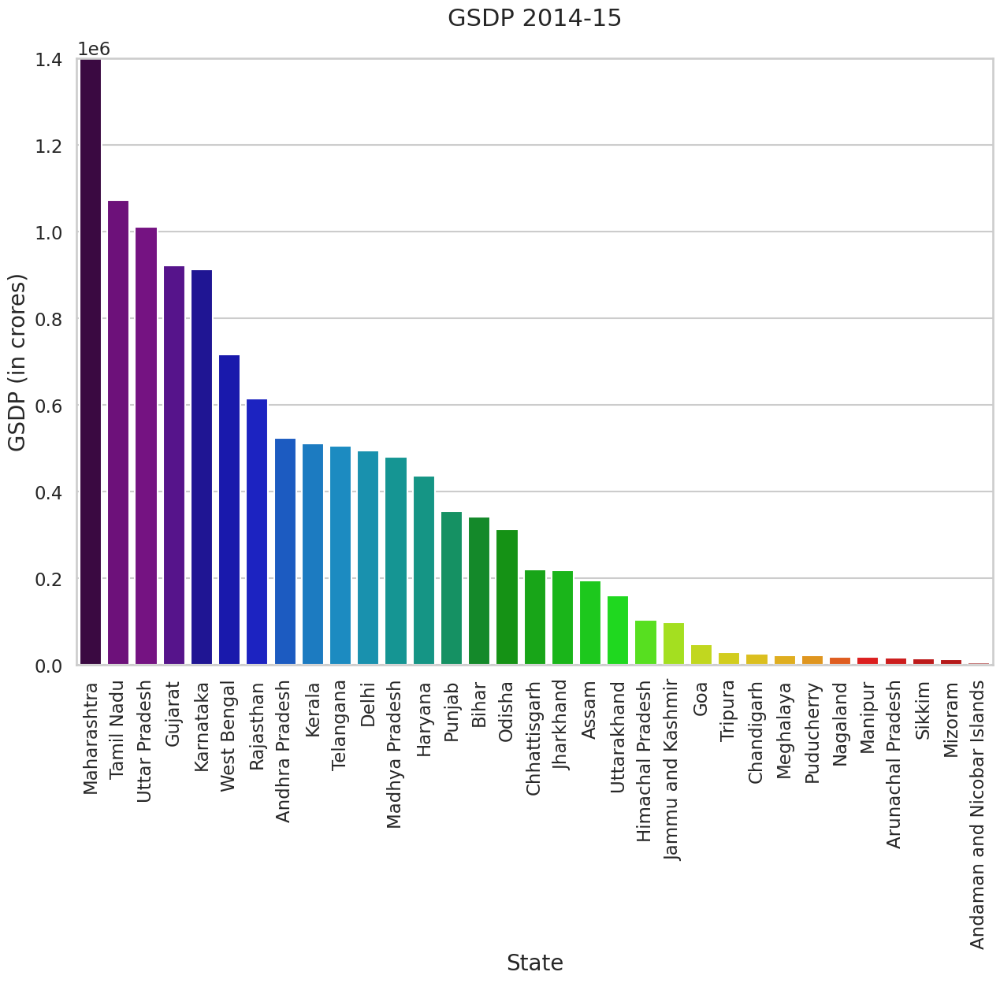

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


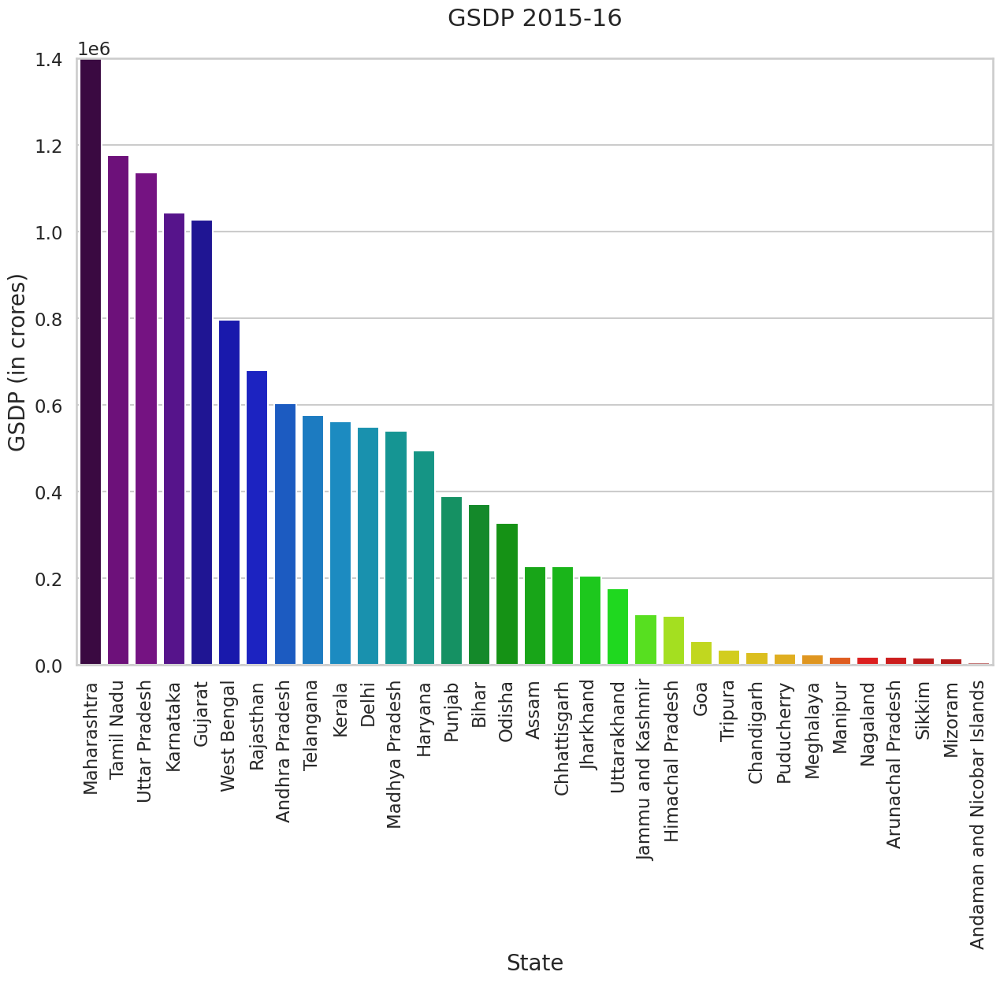

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


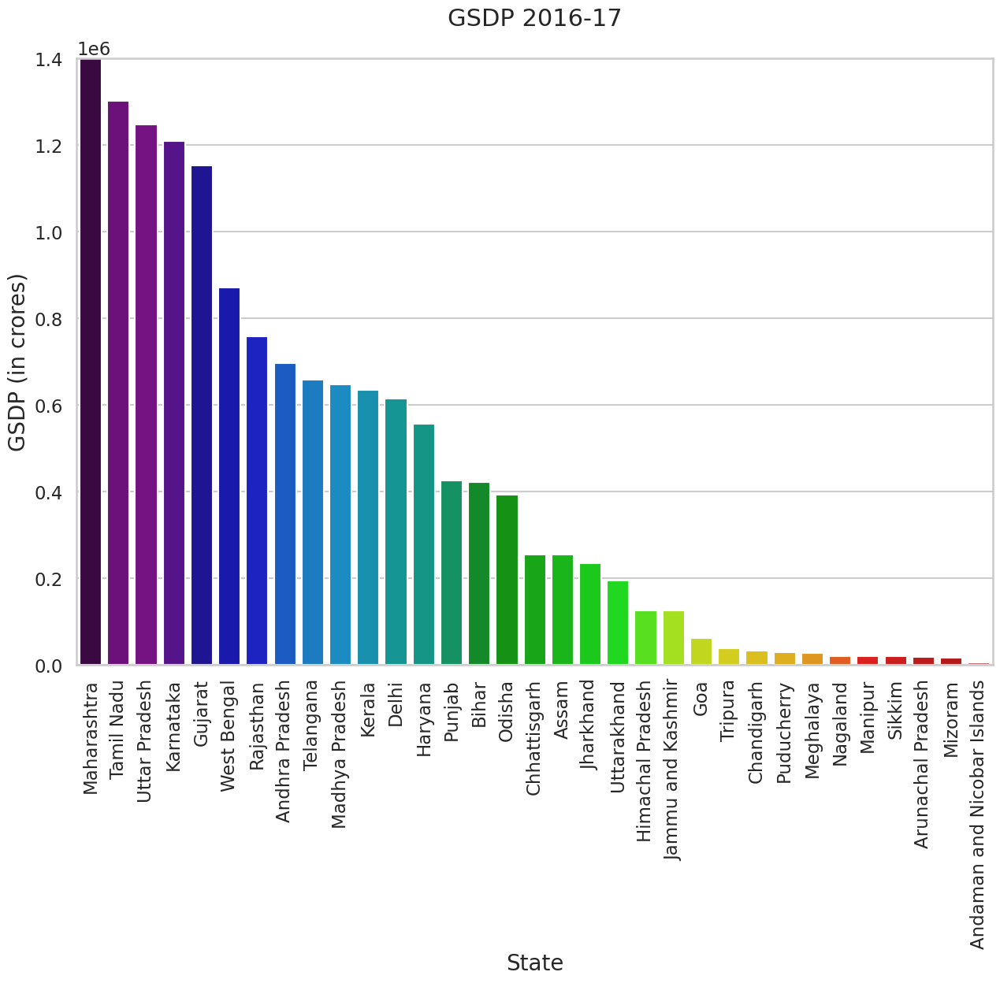

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


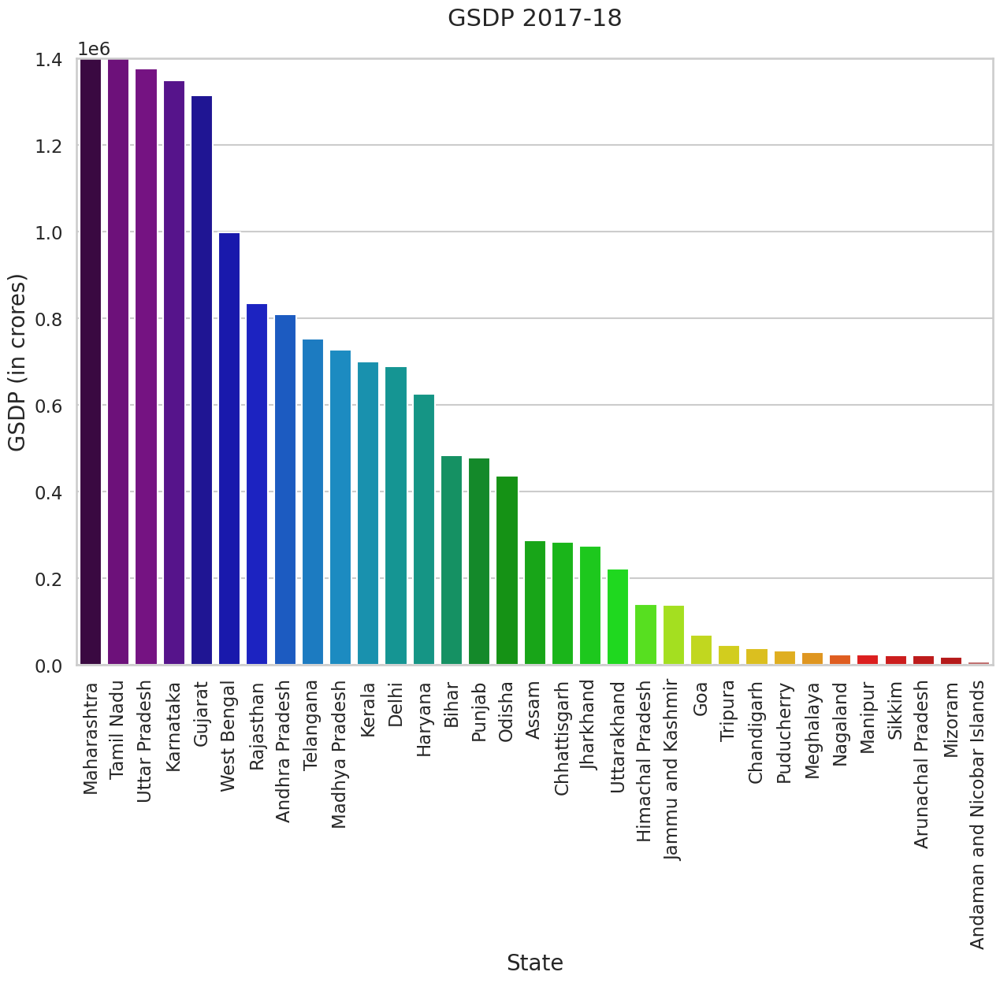

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


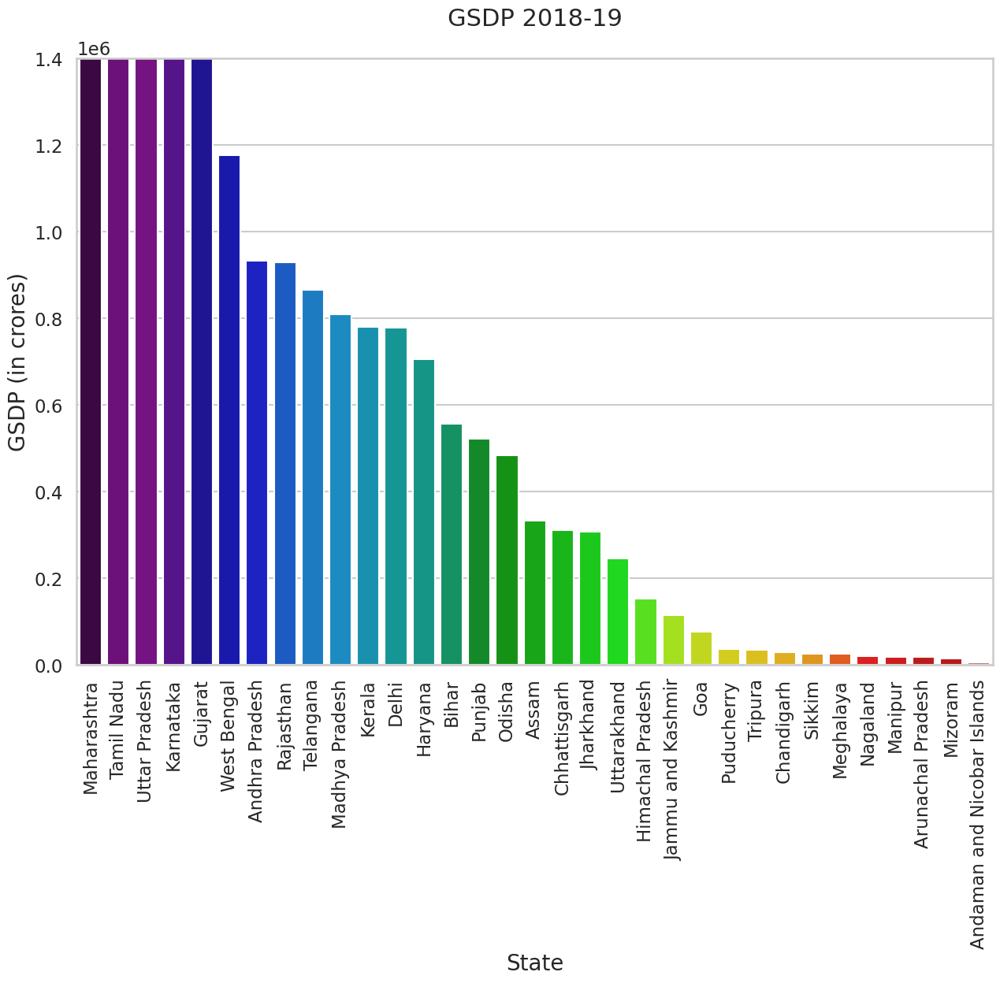

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [ ]:
print('-'* 200)
for col in value_col[1:]:
    sns.set_style("whitegrid")
    sns.set_context('talk')
    plt.figure(figsize=(15,10))
    plt.rcParams["axes.labelsize"] = 20
    plt.rcParams['axes.titlesize'] = 22
    plt.rcParams['axes.titlepad'] = 30

    temp_df = df3_value.loc[:,['state/union_territory',col]]
    temp_df['Index']=range(len(temp_df))
    temp_df[col]=temp_df[col].apply(lambda x:int(x))
    temp_df=temp_df.set_index('Index',drop=True).sort_values(col,ascending=False)

    sns.barplot(x='state/union_territory',y=col,data=temp_df,palette='nipy_spectral')
    plt.xticks(rotation=90)

    plt.xlabel("State")
    plt.ylabel("GSDP (in crores)")
    plt.title("GSDP {}".format(col[:7]))
    plt.ylim(top=1400000)

    plt.show()
    print('-'* 200)

##### **Pie charts**

In [ ]:
df4_value = df2_value.copy().set_index(df2_value['state/union_territory']).drop(['state/union_territory'], axis = 1)

In [ ]:
for year in df4_value.columns.tolist()[1:]:
    fig = px.pie(df4_value[1:], values=year, names=df4_value[1:].index.tolist(), title = 'State wise GDP Contribution in {}'.format(year[:7]))
    fig.show()

##### **Average Growth of States**

In [ ]:
df3_per['avg_per'] = df3_per.mean(axis=1)

In [ ]:
avg_per_df = df3_per.loc[:,['state/union_territory','avg_per']]
avg_per_df['Index']=range(len(avg_per_df))
avg_per_df=avg_per_df.set_index('Index',drop=True).sort_values('avg_per',ascending=False)

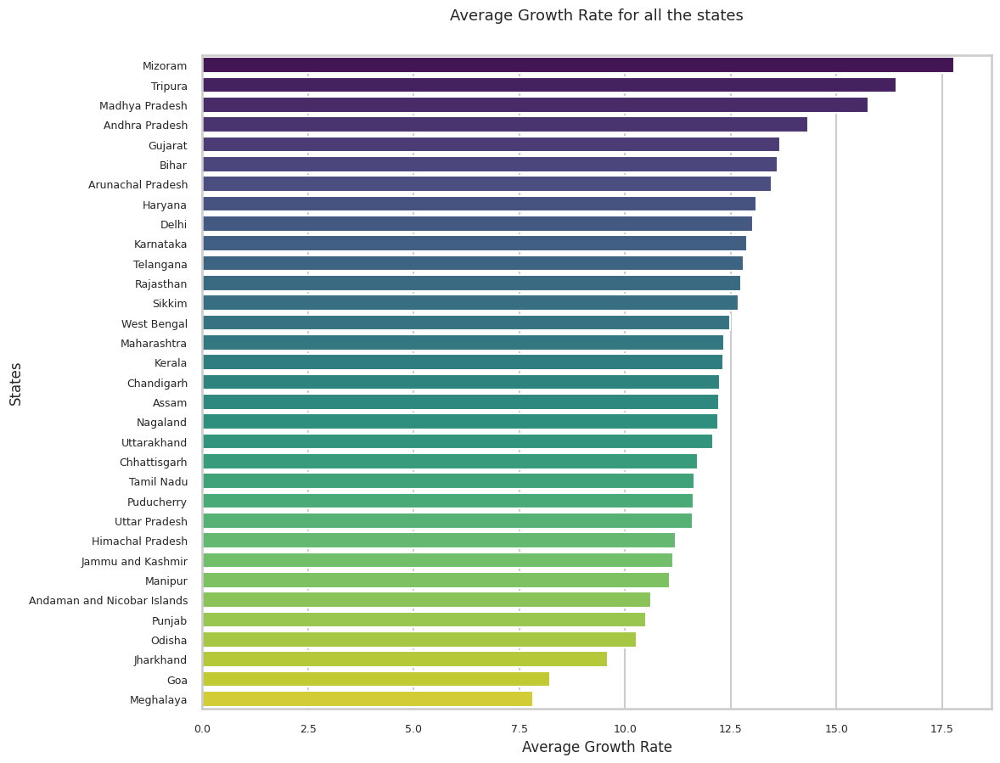

In [ ]:
# plotting the average growth rate for all the states
plt.figure(figsize=(12,10))
sns.barplot(x = avg_per_df['avg_per'], y = avg_per_df['state/union_territory'],palette='viridis')
plt.xlabel('Average Growth Rate', fontsize=12)
plt.ylabel('States', fontsize=12)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.title('Average Growth Rate for all the states',fontsize=13)
plt.show()

##### **Moving Average**

In [ ]:
m_avg=df2_per.T.loc['2011-12(in_per)':,:]
m_avg=m_avg.rolling(window=2).mean()
m_avg=m_avg.iloc[1:]
m_avg=m_avg.T
m_avg['State']=df2_per.loc[:,'state/union_territory'].tolist()

In [ ]:
m_avg.columns = ['2012-13', '2013-14', '2014-15','2015-16', '2016-17', '2017-18','2018-19', 'State']

In [ ]:
m_avg.shape

(34, 8)

In [ ]:
m_avg.head()

,2012-13,2013-14,2014-15,2015-16,2016-17,2017-18,2018-19,State
0,14.785,13.40,12.000000,10.70,10.60,10.400,10.600,India
1,13.225,13.05,13.150000,14.65,15.30,15.380,15.645,Andhra Pradesh
2,15.840,15.03,19.700001,13.25,6.25,10.638,12.076,Arunachal Pradesh
3,10.625,11.45,11.700000,13.30,14.05,12.065,12.530,Assam
4,17.680,13.30,10.250000,7.95,11.50,14.900,14.996,Bihar


In [ ]:
gsdp= m_avg.append(m_avg.iloc[0:34,1:],sort=False)
gsdp.loc[np.isnan(gsdp['2012-13']),['2012-13']]=m_avg['2013-14']
years = ['2014-15',
         '2015-16',
         '2016-17',
         '2017-18',
          '2018-19',
         ]
for year in years:
    gsdp = gsdp.append(gsdp.iloc[0:34,1:],sort=False)
    gsdp.loc[np.isnan(gsdp['2012-13']),['2012-13']]=m_avg[year]

In [ ]:
gsdp.shape

(238, 8)

In [ ]:
gsdp.head()

,2012-13,2013-14,2014-15,2015-16,2016-17,2017-18,2018-19,State
0,14.785,13.40,12.000000,10.70,10.60,10.400,10.600,India
1,13.225,13.05,13.150000,14.65,15.30,15.380,15.645,Andhra Pradesh
2,15.840,15.03,19.700001,13.25,6.25,10.638,12.076,Arunachal Pradesh
3,10.625,11.45,11.700000,13.30,14.05,12.065,12.530,Assam
4,17.680,13.30,10.250000,7.95,11.50,14.900,14.996,Bihar


In [ ]:
gsdp=gsdp.iloc[0:,0::7]

In [ ]:
# Renaming the column names
gsdp.columns=['Rolling_Average','State'] 

In [ ]:
gsdp['Duration']=['2012-13' for i in range(len(gsdp))]

In [ ]:
gsdp.iloc[34:,2]='2013-14'
gsdp.iloc[68:,2]='2014-15'
gsdp.iloc[102:,2]='2015-16'
gsdp.iloc[136:,2]='2016-17'
gsdp.iloc[170:,2]='2017-18'
gsdp.iloc[204:,2]='2018-19'

gsdp['Rolling_Average']=gsdp['Rolling_Average'].apply(lambda x:round(x,2)) 

gsdp.sort_values(by=['Duration','Rolling_Average'],ascending=True,inplace=True)

In [ ]:
gsdp

,Rolling_Average,State,Duration
6,-1.41,Goa,2012-13
33,10.16,Andaman and Nicobar Islands,2012-13
3,10.62,Assam,2012-13
16,10.68,Manipur,2012-13
20,10.97,Odisha,2012-13
...,...,...,...
14,15.02,Madhya Pradesh,2018-19
1,15.64,Andhra Pradesh,2018-19
18,15.88,Mizoram,2018-19
29,16.18,West Bengal,2018-19


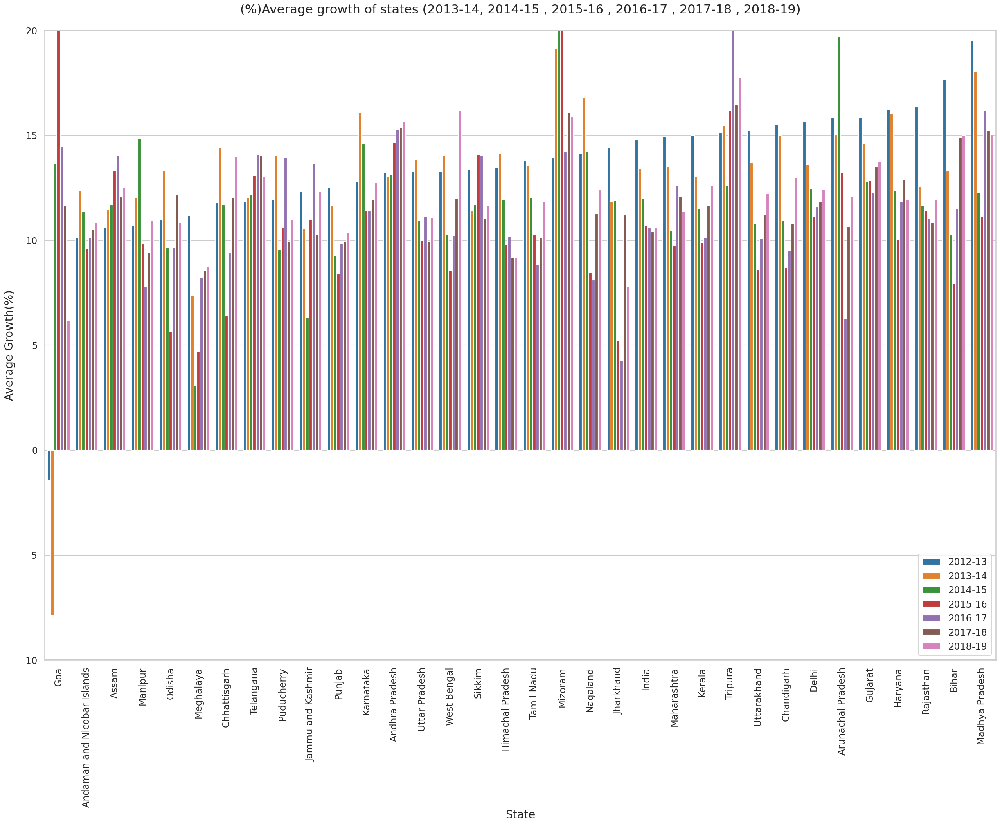

In [ ]:
sns.set_style('whitegrid')
sns.set_context('talk')
plt.figure(figsize=(30,20))
plt.rcParams["axes.labelsize"] = 20
plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.titlepad'] = 30

sns.barplot(x='State',y='Rolling_Average',hue='Duration',data=gsdp,palette='tab10')
plt.xticks(rotation=90)
plt.xlabel('State')
plt.ylabel('Average Growth(%)')
plt.title("(%)Average growth of states"' '"(2013-14, 2014-15 , 2015-16 , 2016-17 , 2017-18 , 2018-19)")

plt.ylim(top=20)
plt.ylim(bottom=-10)
plt.legend(loc=0)
plt.show()

**From above graph we can see that GSDP of Assam , Meghalaya , Andhra Pradesh , Telangana  are growing.**

**From above graph we can see that Himachal Pradesh , Haryana , karnataka , Jharkhand , Rajasthan are declining.**

In [ ]:
home_nat=pd.concat([gsdp.loc[m_avg['State']=='Gujarat'],gsdp.loc[m_avg.State=='India',:]],axis=0)

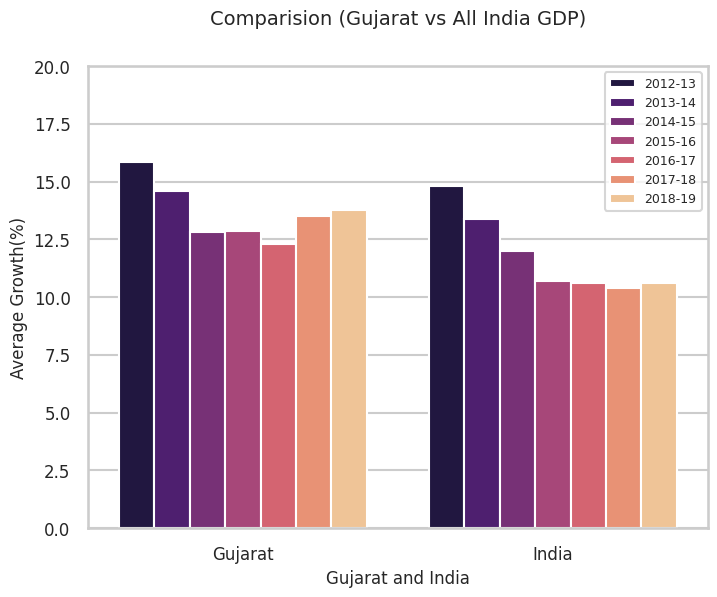

In [ ]:
sns.set_style('whitegrid')
sns.set_context('talk')
plt.figure(figsize=(8,6))
plt.rcParams["axes.labelsize"] = 20
plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.titlepad'] = 30

sns.barplot(x='State',y='Rolling_Average',hue='Duration',data=home_nat,palette='magma')

plt.xlabel('Gujarat and India', fontsize=12)
plt.ylabel('Average Growth(%)', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Comparision (Gujarat vs All India GDP)", fontsize=14)
plt.legend(loc = 'best', fontsize=9)
plt.ylim(top=20)
plt.show()

In [ ]:
m_avg1 = m_avg.copy().T
m_avg1.columns = m_avg1.loc['State'].tolist()
m_avg1.drop('State',axis = 0,inplace=True)
m_avg1 = m_avg1[['India','Maharashtra','Tamil Nadu','Uttar Pradesh','Karnataka','Gujarat']]
m_avg1['Date'] = ['2013-03-31','2014-03-31','2015-03-31','2016-03-31','2017-03-31','2018-03-31','2019-03-31']

In [ ]:
m_avg1

,India,Maharashtra,Tamil Nadu,Uttar Pradesh,Karnataka,Gujarat,Date
2012-13,14.785,14.945,13.775,13.27,12.8,15.855,2013-03-31
2013-14,13.4,13.5,13.55,13.85,16.1,14.6,2014-03-31
2014-15,12.0,10.45,12.05,10.95,14.6,12.8,2015-03-31
2015-16,10.7,9.75,10.25,10.0,11.4,12.85,2016-03-31
2016-17,10.6,12.6,8.85,11.15,11.4,12.3,2017-03-31
2017-18,10.4,12.1,10.15,9.95,11.95,13.51,2018-03-31
2018-19,10.6,11.375,11.86,11.074,12.74,13.76,2019-03-31


In [ ]:
fig = px.line(m_avg1, x='Date', y= m_avg1.columns.tolist()[0] , markers = True , title="Moving avg of INDIA")
fig.show()

In [ ]:
fig = px.line(m_avg1, x='Date', y= m_avg1.columns.tolist()[1:7] , markers = True , title="Moving avg of top 5 State")
fig.show()

##### **Region plot**

In [ ]:
df5 = df2_value.copy()

In [ ]:
df5.drop(0, axis=0, inplace=True)
df5.reset_index(inplace=True)
df5.drop('index', axis=1, inplace=True)

In [ ]:
df5['state/union_territory'][1] = 'Arunanchal Pradesh'
df5['state/union_territory'][9] = 'Jammu & Kashmir'
df5['state/union_territory'][29] = 'Andaman & Nicobar Island'
df5['state/union_territory'][31] = 'NCT of Delhi'

In [ ]:
indian_states = json.load(open("/content/states_india.geojson", 'r'))

In [ ]:
state_id_map = {}
for feature in indian_states['features']:
    feature['id'] = feature['properties']['state_code']
    state_id_map[feature['properties']['st_nm']] = feature['id']

In [ ]:
df5['id'] = df5['state/union_territory'].apply(lambda x: state_id_map[x])

In [ ]:
df5.head()

,state/union_territory,2011-12(in_₹_crore),2012-13(in_₹_crore),2013-14(in_₹_crore),2014-15(in_₹_crore),2015-16(in_₹_crore),2016-17(in_₹_crore),2017-18(in_₹_crore),2018-19(in_₹_crore),id
0,Andhra Pradesh,379402.0,411404.0,464272.0,524976.0,604229.0,697508.0,809547.0,933402.0,28
1,Arunanchal Pradesh,11063.0,12547.0,14581.0,17959.0,18509.0,19627.0,22045.0,18544.2,12
2,Assam,143175.0,156864.0,177745.0,195723.0,227959.0,254478.0,288494.0,332939.0,18
3,Bihar,247144.0,282368.0,317101.0,342951.0,371602.0,422316.0,484740.0,557490.0,10
4,Chhattisgarh,158074.0,177511.0,206833.0,221118.0,227383.0,254722.0,284194.0,311660.0,22


In [ ]:
india_map = folium.Map(location=[22.5937, 78.9629], zoom_start=4)

folium.Choropleth(
    geo_data = indian_states,
    data = df5,
    columns = ["id", "2018-19(in_₹_crore)"],
    key_on = 'id',
    fill_color = 'YlGnBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Indicator'
).add_to(india_map)

In [ ]:
india_map

##### **Correlation**

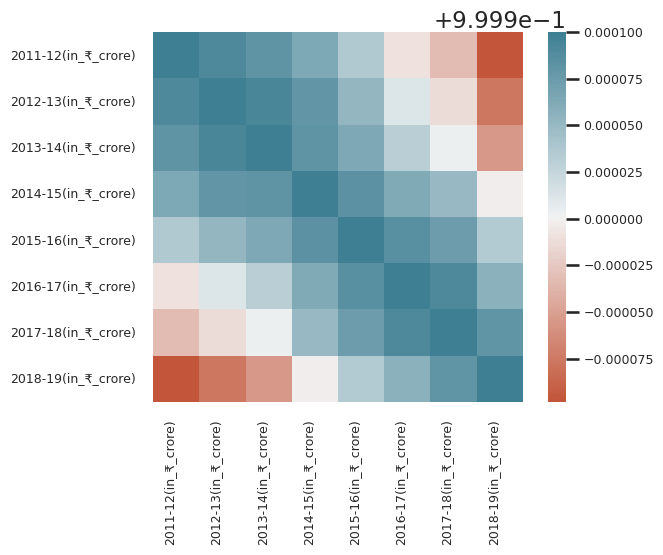

In [ ]:
ax = sns.heatmap(df2_value.corr(),
                 square=True, 
                 cmap=sns.diverging_palette(20, 220, n=200))

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='right'
)

plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=9)
plt.show()

In [ ]:
df2_value.corr()

,2011-12(in_₹_crore),2012-13(in_₹_crore),2013-14(in_₹_crore),2014-15(in_₹_crore),2015-16(in_₹_crore),2016-17(in_₹_crore),2017-18(in_₹_crore),2018-19(in_₹_crore)
2011-12(in_₹_crore),1.000000,0.999990,0.999982,0.999965,0.999937,0.999891,0.999867,0.999802
2012-13(in_₹_crore),0.999990,1.000000,0.999993,0.999980,0.999952,0.999912,0.999888,0.999823
2013-14(in_₹_crore),0.999982,0.999993,1.000000,0.999981,0.999964,0.999931,0.999903,0.999845
2014-15(in_₹_crore),0.999965,0.999980,0.999981,1.000000,0.999984,0.999962,0.999949,0.999898
2015-16(in_₹_crore),0.999937,0.999952,0.999964,0.999984,1.000000,0.999986,0.999974,0.999935
2016-17(in_₹_crore),0.999891,0.999912,0.999931,0.999962,0.999986,1.000000,0.999991,0.999957
2017-18(in_₹_crore),0.999867,0.999888,0.999903,0.999949,0.999974,0.999991,1.000000,0.999980
2018-19(in_₹_crore),0.999802,0.999823,0.999845,0.999898,0.999935,0.999957,0.999980,1.000000


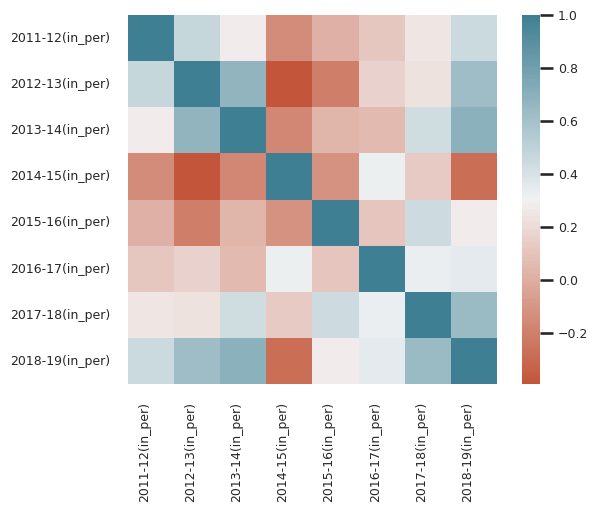

In [ ]:
ax = sns.heatmap(df2_per.corr(),
                 square=True, 
                 cmap=sns.diverging_palette(20, 220, n=200))

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='right'
)

plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=9)
plt.show()

In [ ]:
df2_per.corr()

,2011-12(in_per),2012-13(in_per),2013-14(in_per),2014-15(in_per),2015-16(in_per),2016-17(in_per),2017-18(in_per),2018-19(in_per)
2011-12(in_per),1.000000,0.465737,0.274695,-0.149778,0.016773,0.120597,0.244128,0.447922
2012-13(in_per),0.465737,1.000000,0.678239,-0.394984,-0.211296,0.167763,0.235990,0.623634
2013-14(in_per),0.274695,0.678239,1.000000,-0.169232,0.033031,0.052873,0.429622,0.694449
2014-15(in_per),-0.149778,-0.394984,-0.169232,1.000000,-0.116507,0.321025,0.121312,-0.279787
2015-16(in_per),0.016773,-0.211296,0.033031,-0.116507,1.000000,0.105563,0.439356,0.278494
2016-17(in_per),0.120597,0.167763,0.052873,0.321025,0.105563,1.000000,0.324463,0.346782
2017-18(in_per),0.244128,0.235990,0.429622,0.121312,0.439356,0.324463,1.000000,0.644254
2018-19(in_per),0.447922,0.623634,0.694449,-0.279787,0.278494,0.346782,0.644254,1.000000


### **6) Prediction**

In [ ]:
def Linear_regression(X,y):
    train_x, test_x, train_y, test_y = train_test_split(X,y ,random_state = 42, test_size = 0.60)
    scaler = StandardScaler()

    train_x = scaler.fit_transform(train_x)
    test_x = scaler.transform(test_x)

    model = LinearRegression()
    model.fit(train_x, train_y)

    y_pred = model.predict(test_x)
    rmse = mean_squared_error(test_y, y_pred, squared = False)
    return rmse

In [ ]:
def Polynomial_regression(X,y,degree):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    scaler = StandardScaler()
    X_train_std = scaler.fit_transform(X_train)
    X_test_std = scaler.transform(X_test)
    
    poly = PolynomialFeatures(degree=degree)
    X_train_poly = poly.fit_transform(X_train_std)
    X_test_poly = poly.transform(X_test_std)
    
    model = LinearRegression().fit(X_train_poly, y_train)
  
    y_pred = model.predict(X_test_poly)    
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    return  rmse

In [ ]:
predi_df2_value = df2_value.iloc[:,1:]
predi_df2_per = df2_per.iloc[:,1:]

In [ ]:
X_value = predi_df2_value.iloc[:,:-1]
y_value = predi_df2_value.iloc[:,-1]

In [ ]:
Linear_regression(X_value,y_value)

154373.5145876194

In [ ]:
Polynomial_regression(X_value,y_value,2)

404497.94250352576

In [ ]:
X_per = predi_df2_per.iloc[:,:-1]
y_per = predi_df2_per.iloc[:,-1]

In [ ]:
Linear_regression(X_per,y_per)

2.1079600881911205

In [ ]:
Polynomial_regression(X_per,y_per,2)

2.525334764889368

# **Data :- 2**

### **1) Data Collection**</br>
 * **Type :-** CSV formate
 * **Source :-** [data.gov.in](https://data.gov.in/resource/quarterly-estimates-gdp-constant-2011-12-prices-2011-12-2022-23)
 * **Method :-** fetching

In [ ]:
# Import Dataset
sdf = pd.read_csv('INDIA_GDP_SECTOR_WISE.csv')

### **2) Understand Data** 

In [ ]:
# see colmuns of datasets
sdf.columns

Index(['Item', 'Value (Rs. in crore) - 2011-12 - Q1',
       'Value (Rs. in crore) - 2011-12 - Q2',
       'Value (Rs. in crore) - 2011-12 - Q3',
       'Value (Rs. in crore) - 2011-12 - Q4',
       'Value (Rs. in crore) - 2012-13 - Q1',
       'Value (Rs. in crore) - 2012-13 - Q2',
       'Value (Rs. in crore) - 2012-13 - Q3',
       'Value (Rs. in crore) - 2012-13 - Q4',
       'Value (Rs. in crore) - 2013-14 - Q1',
       'Value (Rs. in crore) - 2013-14 - Q2',
       'Value (Rs. in crore) - 2013-14 - Q3',
       'Value (Rs. in crore) - 2013-14 - Q4',
       'Value (Rs. in crore) - 2014-15 - Q1',
       'Value (Rs. in crore) - 2014-15 - Q2',
       'Value (Rs. in crore) - 2014-15 - Q3',
       'Value (Rs. in crore) - 2014-15 - Q4',
       'Value (Rs. in crore) - 2015-16 - Q1',
       'Value (Rs. in crore) - 2015-16 - Q2',
       'Value (Rs. in crore) - 2015-16 - Q3',
       'Value (Rs. in crore) - 2015-16 - Q4',
       'Value (Rs. in crore) - 2016-17 - Q1',
       'Value (Rs. in cror

In this data, **Item** is different **Sub-Sectors of INDIA** and remaining Quater Wise **value** and **Growth Rate(%)** of GDP of years **2011-12 to 2022-23**.

So, **Item** is **Categorical** and others are **Numerical**.

In [ ]:
# Basic information of datasets
sdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 87 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Item                                 9 non-null      object 
 1   Value (Rs. in crore) - 2011-12 - Q1  9 non-null      float64
 2   Value (Rs. in crore) - 2011-12 - Q2  9 non-null      float64
 3   Value (Rs. in crore) - 2011-12 - Q3  9 non-null      float64
 4   Value (Rs. in crore) - 2011-12 - Q4  9 non-null      float64
 5   Value (Rs. in crore) - 2012-13 - Q1  9 non-null      float64
 6   Value (Rs. in crore) - 2012-13 - Q2  9 non-null      float64
 7   Value (Rs. in crore) - 2012-13 - Q3  9 non-null      float64
 8   Value (Rs. in crore) - 2012-13 - Q4  9 non-null      float64
 9   Value (Rs. in crore) - 2013-14 - Q1  9 non-null      float64
 10  Value (Rs. in crore) - 2013-14 - Q2  9 non-null      float64
 11  Value (Rs. in crore) - 2013-14 - Q3 

In [ ]:
# No of rows and columns in datasets
sdf.shape

(9, 87)

In [ ]:
# See first 5 rows of datasets
sdf.head()

,Item,Value (Rs. in crore) - 2011-12 - Q1,Value (Rs. in crore) - 2011-12 - Q2,Value (Rs. in crore) - 2011-12 - Q3,Value (Rs. in crore) - 2011-12 - Q4,Value (Rs. in crore) - 2012-13 - Q1,Value (Rs. in crore) - 2012-13 - Q2,Value (Rs. in crore) - 2012-13 - Q3,Value (Rs. in crore) - 2012-13 - Q4,Value (Rs. in crore) - 2013-14 - Q1,Value (Rs. in crore) - 2013-14 - Q2,Value (Rs. in crore) - 2013-14 - Q3,Value (Rs. in crore) - 2013-14 - Q4,Value (Rs. in crore) - 2014-15 - Q1,Value (Rs. in crore) - 2014-15 - Q2,Value (Rs. in crore) - 2014-15 - Q3,Value (Rs. in crore) - 2014-15 - Q4,Value (Rs. in crore) - 2015-16 - Q1,Value (Rs. in crore) - 2015-16 - Q2,Value (Rs. in crore) - 2015-16 - Q3,Value (Rs. in crore) - 2015-16 - Q4,Value (Rs. in crore) - 2016-17 - Q1,Value (Rs. in crore) - 2016-17 - Q2,Value (Rs. in crore) - 2016-17 - Q3,Value (Rs. in crore) - 2016-17 - Q4,Value (Rs. in crore) - 2017-18 - Q1,Value (Rs. in crore) - 2017-18 - Q2,Value (Rs. in crore) - 2017-18 - Q3,Value (Rs. in crore) - 2017-18 - Q4,Value (Rs. in crore) - 2018-19 - Q1,Value (Rs. in crore) - 2018-19 - Q2,Value (Rs. in crore) - 2018-19 - Q3,Value (Rs. in crore) - 2018-19 - Q4,Value (Rs. in crore) - 2019-20 - Q1,Value (Rs. in crore) - 2019-20 - Q2,Value (Rs. in crore) - 2019-20 - Q3,Value (Rs. in crore) - 2019-20 - Q4,Value (Rs. in crore) - 2020-21 - Q1,Value (Rs. in crore) - 2020-21 - Q2,Value (Rs. in crore) - 2020-21 - Q3,Value (Rs. in crore) - 2020-21 - Q4,Value (Rs. in crore) - 2021-22 - Q1,Value (Rs. in crore) - 2021-22 - Q2,Value (Rs. in crore) - 2021-22- Q3,Value (Rs. in crore) - 2021-22- Q4,Value (Rs. in crore) - 2022-23- Q1,Growth Rate (%) - 2012-13 - Q1,Growth Rate (%) - 2012-13 - Q2,Growth Rate (%) - 2012-13 - Q3,Growth Rate (%) - 2012-13 - Q4,Growth Rate (%) - 2013-14 - Q1,Growth Rate (%) - 2013-14 - Q2,Growth Rate (%) - 2013-14 - Q3,Growth Rate (%) - 2013-14 - Q4,Growth Rate (%) - 2014-15 - Q1,Growth Rate (%) - 2014-15 - Q2,Growth Rate (%) - 2014-15 - Q3,Growth Rate (%) - 2014-15 - Q4,Growth Rate (%) - 2015-16 - Q1,Growth Rate (%) - 2015-16 - Q2,Growth Rate (%) - 2015-16 - Q3,Growth Rate (%) - 2015-16 - Q4,Growth Rate (%) - 2016-17 - Q1,Growth Rate (%) - 2016-17 - Q2,Growth Rate (%) - 2016-17 - Q3,Growth Rate (%) - 2016-17 - Q4,Growth Rate (%) - 2017-18 - Q1,Growth Rate (%) - 2017-18 - Q2,Growth Rate (%) - 2017-18 - Q3,Growth Rate (%) - 2017-18 - Q4,Growth Rate (%) - 2018-19 - Q1,Growth Rate (%) - 2018-19 - Q2,Growth Rate (%) - 2018-19 - Q3,Growth Rate (%) - 2018-19 - Q4,Growth Rate (%) - 2019-20 - Q1,Growth Rate (%) - 2019-20 - Q2,Growth Rate (%) - 2019-20 - Q3,Growth Rate (%) - 2019-20 - Q4,Growth Rate (%) - 2020-21 - Q1,Growth Rate (%) - 2020-21 - Q2,Growth Rate (%) - 2020-21 - Q3,Growth Rate (%) - 2020-21 - Q4,Growth Rate (%) - 2021-22- Q1,Growth Rate (%) - 2021-22- Q2,Growth Rate (%) - 2021-22- Q3,Growth Rate (%) - 2021-22- Q4,Growth Rate (%) - 2022-23- Q1
0,"1. Agriculture, forestry & fishing",336108.84,269074.12,500965.58,395797.55,341199.19,274362.46,506048.76,402678.10,354449.52,289365.47,539360.33,426023.07,362652.81,299493.88,522894.15,420673.41,371273.07,307806.19,511553.11,425513.56,389609.65,326769.16,549199.10,460425.93,413332.38,348961.89,581218.70,496509.92,433154.05,364398.39,589159.51,491886.41,448703.33,381401.26,620878.10,531320.22,462006.28,393424.15,646277.54,546323.92,472257.92,405870.29,662688.47,568879.89,493325.01,1.51,1.97,1.01,1.74,3.88,5.47,6.58,5.80,2.31,3.50,-3.05,-1.26,2.38,2.78,-2.17,1.15,4.94,6.16,7.36,8.20,6.09,6.79,5.83,7.84,4.80,4.42,1.37,-0.93,3.59,4.67,5.38,8.02,2.96,3.15,4.09,2.82,2.22,3.16,2.54,4.13,4.46
1,2. Mining & quarrying,67872.92,56967.37,64848.79,71346.27,70780.17,55618.24,64858.70,71351.53,68133.94,55660.81,64419.19,74892.02,79535.74,57939.66,68662.61,82547.44,87184.26,63469.33,75874.85,91445.36,93381.81,67440.70,82751.16,105674.05,84065.06,69707.30,79546.33,96293.36,83092.09,67688.25,79355.70,96680.53,82696.43,65070.66,77460.10,96539.19,67999.62,59916.25,73346.39,92762.03,80242.81,68626.06,80095.43,9

In [ ]:
# A quick stattistical view
sdf.describe()

,Value (Rs. in crore) - 2011-12 - Q1,Value (Rs. in crore) - 2011-12 - Q2,Value (Rs. in crore) - 2011-12 - Q3,Value (Rs. in crore) - 2011-12 - Q4,Value (Rs. in crore) - 2012-13 - Q1,Value (Rs. in crore) - 2012-13 - Q2,Value (Rs. in crore) - 2012-13 - Q3,Value (Rs. in crore) - 2012-13 - Q4,Value (Rs. in crore) - 2013-14 - Q1,Value (Rs. in crore) - 2013-14 - Q2,Value (Rs. in crore) - 2013-14 - Q3,Value (Rs. in crore) - 2013-14 - Q4,Value (Rs. in crore) - 2014-15 - Q1,Value (Rs. in crore) - 2014-15 - Q2,Value (Rs. in crore) - 2014-15 - Q3,Value (Rs. in crore) - 2014-15 - Q4,Value (Rs. in crore) - 2015-16 - Q1,Value (Rs. in crore) - 2015-16 - Q2,Value (Rs. in crore) - 2015-16 - Q3,Value (Rs. in crore) - 2015-16 - Q4,Value (Rs. in crore) - 2016-17 - Q1,Value (Rs. in crore) - 2016-17 - Q2,Value (Rs. in crore) - 2016-17 - Q3,Value (Rs. in crore) - 2016-17 - Q4,Value (Rs. in crore) - 2017-18 - Q1,Value (Rs. in crore) - 2017-18 - Q2,Value (Rs. in crore) - 2017-18 - Q3,Value (Rs. in crore) - 2017-18 - Q4,Value (Rs. in crore) - 2018-19 - Q1,Value (Rs. in crore) - 2018-19 - Q2,Value (Rs. in crore) - 2018-19 - Q3,Value (Rs. in crore) - 2018-19 - Q4,Value (Rs. in crore) - 2019-20 - Q1,Value (Rs. in crore) - 2019-20 - Q2,Value (Rs. in crore) - 2019-20 - Q3,Value (Rs. in crore) - 2019-20 - Q4,Value (Rs. in crore) - 2020-21 - Q1,Value (Rs. in crore) - 2020-21 - Q2,Value (Rs. in crore) - 2020-21 - Q3,Value (Rs. in crore) - 2020-21 - Q4,Value (Rs. in crore) - 2021-22 - Q1,Value (Rs. in crore) - 2021-22 - Q2,Value (Rs. in crore) - 2021-22- Q3,Value (Rs. in crore) - 2021-22- Q4,Value (Rs. in crore) - 2022-23- Q1,Growth Rate (%) - 2012-13 - Q1,Growth Rate (%) - 2012-13 - Q2,Growth Rate (%) - 2012-13 - Q3,Growth Rate (%) - 2012-13 - Q4,Growth Rate (%) - 2013-14 - Q1,Growth Rate (%) - 2013-14 - Q2,Growth Rate (%) - 2013-14 - Q3,Growth Rate (%) - 2013-14 - Q4,Growth Rate (%) - 2014-15 - Q1,Growth Rate (%) - 2014-15 - Q2,Growth Rate (%) - 2014-15 - Q3,Growth Rate (%) - 2014-15 - Q4,Growth Rate (%) - 2015-16 - Q1,Growth Rate (%) - 2015-16 - Q2,Growth Rate (%) - 2015-16 - Q3,Growth Rate (%) - 2015-16 - Q4,Growth Rate (%) - 2016-17 - Q1,Growth Rate (%) - 2016-17 - Q2,Growth Rate (%) - 2016-17 - Q3,Growth Rate (%) - 2016-17 - Q4,Growth Rate (%) - 2017-18 - Q1,Growth Rate (%) - 2017-18 - Q2,Growth Rate (%) - 2017-18 - Q3,Growth Rate (%) - 2017-18 - Q4,Growth Rate (%) - 2018-19 - Q1,Growth Rate (%) - 2018-19 - Q2,Growth Rate (%) - 2018-19 - Q3,Growth Rate (%) - 2018-19 - Q4,Growth Rate (%) - 2019-20 - Q1,Growth Rate (%) - 2019-20 - Q2,Growth Rate (%) - 2019-20 - Q3,Growth Rate (%) - 2019-20 - Q4,Growth Rate (%) - 2020-21 - Q1,Growth Rate (%) - 2020-21 - Q2,Growth Rate (%) - 2020-21 - Q3,Growth Rate (%) - 2020-21 - Q4,Growth Rate (%) - 2021-22- Q1,Growth Rate (%) - 2021-22- Q2,Growth Rate (%) - 2021-22- Q3,Growth Rate (%) - 2021-22- Q4,Growth Rate (%) - 2022-23- Q1
count,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000e+00,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
mean,4.375850e+05,4.251571e+05,4.608657e+05,4.779359e+05,4.610198e+05,4.550908e+05,4.838952e+05,4.991669e+05,4.902732e+05,4.875327e+05,5.144313e+05,5.219065

### **3) Restructuring data**


In [ ]:
# Rename the columns
cols = sdf.columns
for col in cols[1:]:
    sdf.rename(columns={ col : col.replace(' - ',' ').replace('- ',' ').replace(' ','_')}, inplace=True)

In [ ]:
sdf.columns

Index(['Item', 'Value_(Rs._in_crore)_2011-12_Q1',
       'Value_(Rs._in_crore)_2011-12_Q2', 'Value_(Rs._in_crore)_2011-12_Q3',
       'Value_(Rs._in_crore)_2011-12_Q4', 'Value_(Rs._in_crore)_2012-13_Q1',
       'Value_(Rs._in_crore)_2012-13_Q2', 'Value_(Rs._in_crore)_2012-13_Q3',
       'Value_(Rs._in_crore)_2012-13_Q4', 'Value_(Rs._in_crore)_2013-14_Q1',
       'Value_(Rs._in_crore)_2013-14_Q2', 'Value_(Rs._in_crore)_2013-14_Q3',
       'Value_(Rs._in_crore)_2013-14_Q4', 'Value_(Rs._in_crore)_2014-15_Q1',
       'Value_(Rs._in_crore)_2014-15_Q2', 'Value_(Rs._in_crore)_2014-15_Q3',
       'Value_(Rs._in_crore)_2014-15_Q4', 'Value_(Rs._in_crore)_2015-16_Q1',
       'Value_(Rs._in_crore)_2015-16_Q2', 'Value_(Rs._in_crore)_2015-16_Q3',
       'Value_(Rs._in_crore)_2015-16_Q4', 'Value_(Rs._in_crore)_2016-17_Q1',
       'Value_(Rs._in_crore)_2016-17_Q2', 'Value_(Rs._in_crore)_2016-17_Q3',
       'Value_(Rs._in_crore)_2016-17_Q4', 'Value_(Rs._in_crore)_2017-18_Q1',
       'Value_(Rs._in_cror

In [ ]:
# Convert to appropriate data type
for i in sdf.columns[1:]:
    sdf[i] = pd.to_numeric(sdf[i], errors='coerce', downcast='float')

In [ ]:
sdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 87 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Item                             9 non-null      object 
 1   Value_(Rs._in_crore)_2011-12_Q1  9 non-null      float64
 2   Value_(Rs._in_crore)_2011-12_Q2  9 non-null      float64
 3   Value_(Rs._in_crore)_2011-12_Q3  9 non-null      float64
 4   Value_(Rs._in_crore)_2011-12_Q4  9 non-null      float64
 5   Value_(Rs._in_crore)_2012-13_Q1  9 non-null      float64
 6   Value_(Rs._in_crore)_2012-13_Q2  9 non-null      float64
 7   Value_(Rs._in_crore)_2012-13_Q3  9 non-null      float64
 8   Value_(Rs._in_crore)_2012-13_Q4  9 non-null      float64
 9   Value_(Rs._in_crore)_2013-14_Q1  9 non-null      float64
 10  Value_(Rs._in_crore)_2013-14_Q2  9 non-null      float64
 11  Value_(Rs._in_crore)_2013-14_Q3  9 non-null      float64
 12  Value_(Rs._in_crore)_2013-

In [ ]:
sdf_value = sdf.iloc[:,:46]

In [ ]:
col = [0]
col.extend(list(range(46,87)))

In [ ]:
sdf_per = sdf.iloc[:,col]

In [ ]:
sdf_value.head()

,Item,Value_(Rs._in_crore)_2011-12_Q1,Value_(Rs._in_crore)_2011-12_Q2,Value_(Rs._in_crore)_2011-12_Q3,Value_(Rs._in_crore)_2011-12_Q4,Value_(Rs._in_crore)_2012-13_Q1,Value_(Rs._in_crore)_2012-13_Q2,Value_(Rs._in_crore)_2012-13_Q3,Value_(Rs._in_crore)_2012-13_Q4,Value_(Rs._in_crore)_2013-14_Q1,Value_(Rs._in_crore)_2013-14_Q2,Value_(Rs._in_crore)_2013-14_Q3,Value_(Rs._in_crore)_2013-14_Q4,Value_(Rs._in_crore)_2014-15_Q1,Value_(Rs._in_crore)_2014-15_Q2,Value_(Rs._in_crore)_2014-15_Q3,Value_(Rs._in_crore)_2014-15_Q4,Value_(Rs._in_crore)_2015-16_Q1,Value_(Rs._in_crore)_2015-16_Q2,Value_(Rs._in_crore)_2015-16_Q3,Value_(Rs._in_crore)_2015-16_Q4,Value_(Rs._in_crore)_2016-17_Q1,Value_(Rs._in_crore)_2016-17_Q2,Value_(Rs._in_crore)_2016-17_Q3,Value_(Rs._in_crore)_2016-17_Q4,Value_(Rs._in_crore)_2017-18_Q1,Value_(Rs._in_crore)_2017-18_Q2,Value_(Rs._in_crore)_2017-18_Q3,Value_(Rs._in_crore)_2017-18_Q4,Value_(Rs._in_crore)_2018-19_Q1,Value_(Rs._in_crore)_2018-19_Q2,Value_(Rs._in_crore)_2018-19_Q3,Value_(Rs._in_crore)_2018-19_Q4,Value_(Rs._in_crore)_2019-20_Q1,Value_(Rs._in_crore)_2019-20_Q2,Value_(Rs._in_crore)_2019-20_Q3,Value_(Rs._in_crore)_2019-20_Q4,Value_(Rs._in_crore)_2020-21_Q1,Value_(Rs._in_crore)_2020-21_Q2,Value_(Rs._in_crore)_2020-21_Q3,Value_(Rs._in_crore)_2020-21_Q4,Value_(Rs._in_crore)_2021-22_Q1,Value_(Rs._in_crore)_2021-22_Q2,Value_(Rs._in_crore)_2021-22_Q3,Value_(Rs._in_crore)_2021-22_Q4,Value_(Rs._in_crore)_2022-23_Q1
0,"1. Agriculture, forestry & fishing",336108.84,269074.12,500965.58,395797.55,341199.19,274362.46,506048.76,402678.10,354449.52,289365.47,539360.33,426023.07,362652.81,299493.88,522894.15,420673.41,371273.07,307806.19,511553.11,425513.56,389609.65,326769.16,549199.10,460425.93,413332.38,348961.89,581218.70,496509.92,433154.05,364398.39,589159.51,491886.41,448703.33,381401.26,620878.10,531320.22,462006.28,393424.15,646277.54,546323.92,472257.92,405870.29,662688.47,568879.89,493325.01
1,2. Mining & quarrying,67872.92,56967.37,64848.79,71346.27,70780.17,55618.24,64858.70,71351.53,68133.94,55660.81,64419.19,74892.02,79535.74,57939.66,68662.61,82547.44,87184.26,63469.33,75874.85,91445.36,93381.81,67440.70,82751.16,105674.05,84065.06,69707.30,79546.33,96293.36,83092.09,67688.25,79355.70,96680.53,82696.43,65070.66,77460.10,96539.19,67999.62,59916.25,73346.39,92762.03,80242.81,68626.06,80095.43,99019.54,85423.28
2,3. Manufacturing,356022.31,333104.49,333674.45,387184.00,358339.68,373953.33,355777.89,398803.21,383075.92,387587.27,377185.58,412860.00,422168.54,423756.92,389832.86,448178.38,466223.73,472854.57,450360.00,514411.29,512044.79,508973.89,487552.76,546192.90,511988.60,553424.47,537524.61,606490.08,565138.65,583153.97,563759.35,616940.24,565525.93,562811.78,544694.92,588261.24,387448.46,591928.53,590503.71,677859.31,577248.58,624891.22,592268.36,676414.20,605104.27
3,"4. Electricity, gas ,water supply& other utili...",46302.44,46466.05,46622.95,47276.56,48479.92,47289.98,48003.94,47861.15,49464.10,50076.29,49637.36,50423.26,53899.61,54880.05,53220.85,52046.48,55231.76,57848.31,55199.98,55877.95,62529.07,62354.65,60850.25,60763.04,69161.27,69358.70,66571.45,67558.60,74424.65,76047.57,72707.65,70967.13,79692.97,77506.20,70544.02,72931.73,67901.27,74996.54,71572.79,75300.62,77296.97,81385.20,74222.36,78693.50,88639.68
4,5. Construction,186776.64,190701.47,195723.78,204132.57,189865.80,186137.15,194069.25,209977.90,198716.44,194457.78,198469.68,209126.98,209578.95,204911.79,206558.37,214179.51,218252.83,205790.45,216448.58,224843.08,234541.37,222843.92,232427.07,226632.17,235401.37,226647.31,243990.85,258266.14,251353.53,239218.88,260988.39,275228.39,259728.23,240792.09,257708.14,280451.33,131436.97,224896.92,274752.37,331749.13,225166.19,243071.30,267074.26,338283.22,262917.64


In [ ]:
sdf_per.head()

,Item,Growth_Rate_(%)_2012-13_Q1,Growth_Rate_(%)_2012-13_Q2,Growth_Rate_(%)_2012-13_Q3,Growth_Rate_(%)_2012-13_Q4,Growth_Rate_(%)_2013-14_Q1,Growth_Rate_(%)_2013-14_Q2,Growth_Rate_(%)_2013-14_Q3,Growth_Rate_(%)_2013-14_Q4,Growth_Rate_(%)_2014-15_Q1,Growth_Rate_(%)_2014-15_Q2,Growth_Rate_(%)_2014-15_Q3,Growth_Rate_(%)_2014-15_Q4,Growth_Rate_(%)_2015-16_Q1,Growth_Rate_(%)_2015-16_Q2,Growth_Rate_(%)_2015-16_Q3,Growth_Rate_(%)_2015-16_Q4,Growth_Rate_(%)_2016-17_Q1,Growth_Rate_(%)_2016-17_Q2,Growth_Rate_(%)_2016-17_Q3,Growth_Rate_(%)_2016-17_Q4,Growth_Rate_(%)_2017-18_Q1,Growth_Rate_(%)_2017-18_Q2,Growth_Rate_(%)_2017-18_Q3,Growth_Rate_(%)_2017-18_Q4,Growth_Rate_(%)_2018-19_Q1,Growth_Rate_(%)_2018-19_Q2,Growth_Rate_(%)_2018-19_Q3,Growth_Rate_(%)_2018-19_Q4,Growth_Rate_(%)_2019-20_Q1,Growth_Rate_(%)_2019-20_Q2,Growth_Rate_(%)_2019-20_Q3,Growth_Rate_(%)_2019-20_Q4,Growth_Rate_(%)_2020-21_Q1,Growth_Rate_(%)_2020-21_Q2,Growth_Rate_(%)_2020-21_Q3,Growth_Rate_(%)_2020-21_Q4,Growth_Rate_(%)_2021-22_Q1,Growth_Rate_(%)_2021-22_Q2,Growth_Rate_(%)_2021-22_Q3,Growth_Rate_(%)_2021-22_Q4,Growth_Rate_(%)_2022-23_Q1
0,"1. Agriculture, forestry & fishing",1.51,1.97,1.01,1.74,3.88,5.47,6.58,5.80,2.31,3.50,-3.05,-1.26,2.38,2.78,-2.17,1.15,4.94,6.16,7.36,8.20,6.09,6.79,5.83,7.84,4.80,4.42,1.37,-0.93,3.59,4.67,5.38,8.02,2.960000,3.15,4.09,2.820000,2.220000,3.16,2.54,4.13,4.46
1,2. Mining & quarrying,4.28,-2.37,0.02,0.01,-3.74,0.08,-0.68,4.96,16.73,4.09,6.59,10.22,9.62,9.54,10.50,10.78,7.11,6.26,9.06,15.56,-9.98,3.36,-3.87,-8.88,-1.16,-2.90,-0.24,0.40,-0.48,-3.87,-2.39,-0.15,-17.770000,-7.92,-5.31,-3.910000,18.000000,14.54,9.20,6.75,6.46
2,3. Manufacturing,0.65,12.26,6.62,3.00,6.90,3.65,6.02,3.52,10.20,9.33,3.35,8.55,10.44,11.59,15.53,14.78,9.83,7.64,8.26,6.18,-0.01,8.73,10.25,11.04,10.38,5.37,4.88,1.72,0.07,-3.49,-3.38,-4.65,-31.490000,5.17,8.41,15.230000,48.990002,5.57,0.30,-0.21,4.83
3,"4. Electricity, gas ,water supply& other utili...",4.70,1.77,2.96,1.24,2.03,5.89,3.40,5.35,8.97,9.59,7.22,3.22,2.47,5.41,3.72,7.36,13.21,7.79,10.24,8.74,10.61,11.23,9.40,11.18,7.61,9.64,9.22,5.05,7.08,1.92,-2.98,2.77,-14.800000,-3.24,1.46,3.250000,13.840000,8.52,3.70,4.51,14.67
4,5. Construction,1.65,-2.39,-0.85,2.86,4.66,4.47,2.27,-0.41,5.47,5.38,4.08,2.42,4.14,0.43,4.79,4.98,7.46,8.29,7.38,0.80,0.37,1.71,4.98,13.96,6.78,5.55,6.97,6.57,3.33,0.66,-1.26,1.90,-49.389999,-6.60,6.61,18.290001,71.309998,8.08,-2.79,1.97,16.77


### **4) Data Cleaning**

In [ ]:
sdf_value.isna().sum().sum()

0

In [ ]:
sdf_per.isna().sum().sum()

0

In our data no missing values.</br>
So, No need to fill.

### **5) Data Visualization**

In [ ]:
sdf1_value = sdf_value.iloc[:,:-1].copy()
sdf1_per = sdf_per.iloc[:,:-1].copy()

In [ ]:
years = [
    '2011-12',
    '2012-13',
    '2013-14',
    '2014-15',
    '2015-16',
    '2016-17',
    '2017-18',
    '2018-19',
    '2019-20',
    '2020-21',
    '2021-22'
]

In [ ]:
i = 1
for year in years:
    sdf1_value[year] = sdf1_value.iloc[:,i:i+4].sum(axis = 1)
    i+=4

In [ ]:
i = 1
for year in years:
    sdf1_per[year] = sdf1_per.iloc[:,i:i+4].sum(axis = 1)
    i+=4

In [ ]:
sdf1_value = sdf1_value.loc[:,['Item','2011-12','2012-13','2013-14','2014-15','2015-16','2016-17','2017-18','2018-19','2019-20','2020-21','2021-22']]

In [ ]:
sdf1_per = sdf1_per.loc[:,['Item','2011-12','2012-13','2013-14','2014-15','2015-16','2016-17','2017-18','2018-19','2019-20','2020-21','2021-22']]

In [ ]:
sdf1_value.columns = ['Item','2011-12(in_crore)','2012-13(in_crore)','2013-14(in_crore)','2014-15(in_crore)','2015-16(in_crore)','2016-17(in_crore)','2017-18(in_crore)','2018-19(in_crore)','2019-20(in_crore)','2020-21(in_crore)','2021-22(in_crore)']

In [ ]:
sdf1_per.columns = ['Item','2011-12(in_per)','2012-13(in_per)','2013-14(in_per)','2014-15(in_per)','2015-16(in_per)','2016-17(in_per)','2017-18(in_per)','2018-19(in_per)','2019-20(in_per)','2020-21(in_per)','2021-22(in_per)']

In [ ]:
sdf1_value["sector"] = ["Primary","Primary" , 'Secondary' , 'Secondary','Secondary','Tertiary','Tertiary','Tertiary',None]
sdf1_per["sector"] = ["Primary","Primary" , 'Secondary' , 'Secondary','Secondary','Tertiary','Tertiary','Tertiary',None]

##### **Year wise bar chart**

---------------------------------------------------------------------------------------------------------------------------------------------------------------------


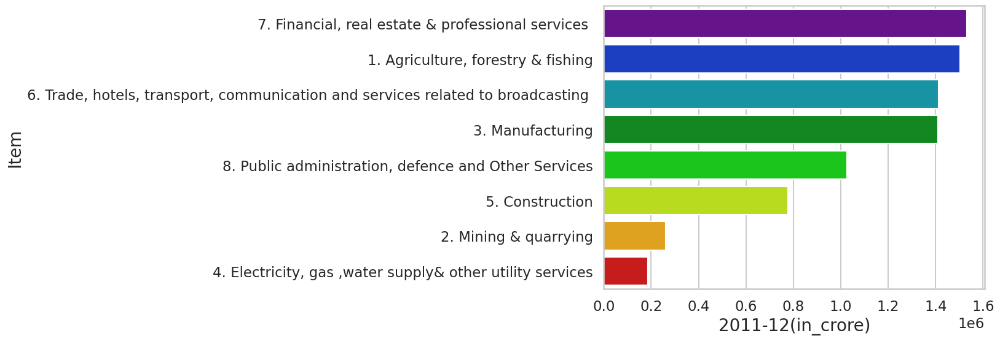

---------------------------------------------------------------------------------------------------------------------------------------------------------------------


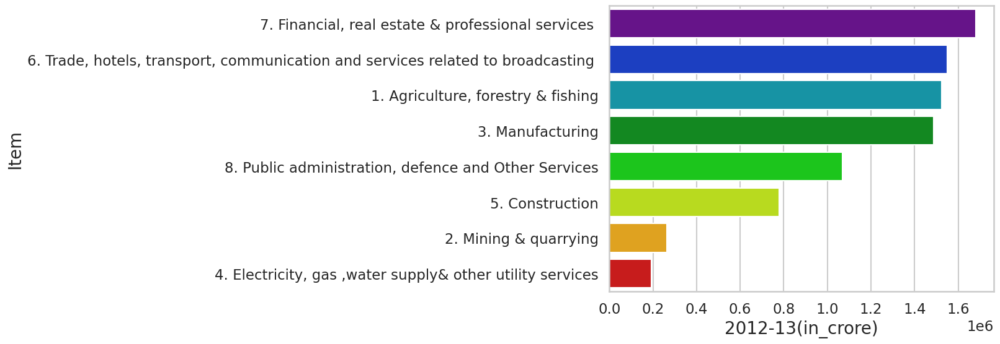

---------------------------------------------------------------------------------------------------------------------------------------------------------------------


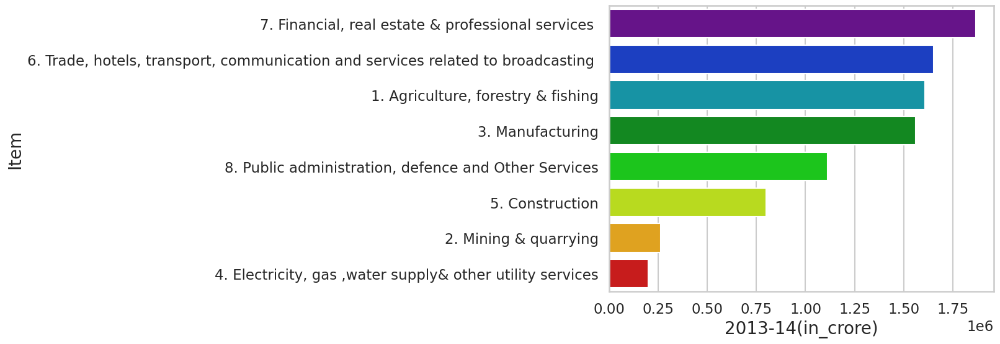

---------------------------------------------------------------------------------------------------------------------------------------------------------------------


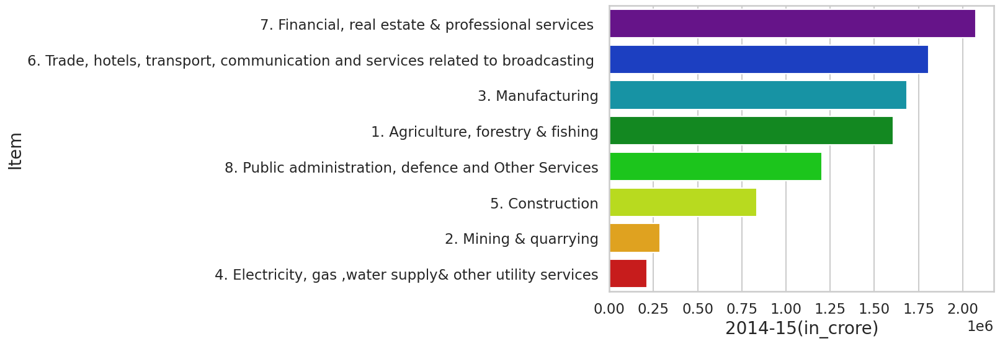

---------------------------------------------------------------------------------------------------------------------------------------------------------------------


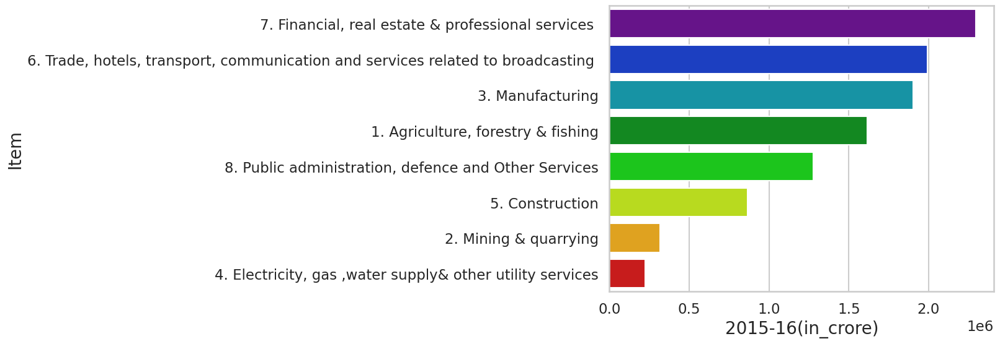

---------------------------------------------------------------------------------------------------------------------------------------------------------------------


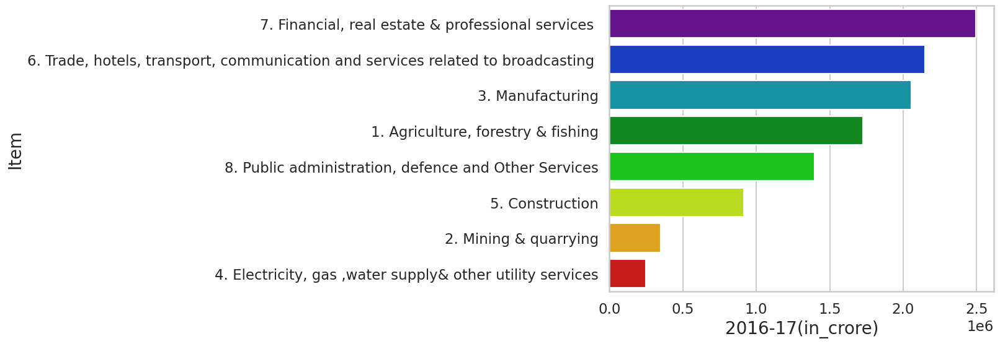

---------------------------------------------------------------------------------------------------------------------------------------------------------------------


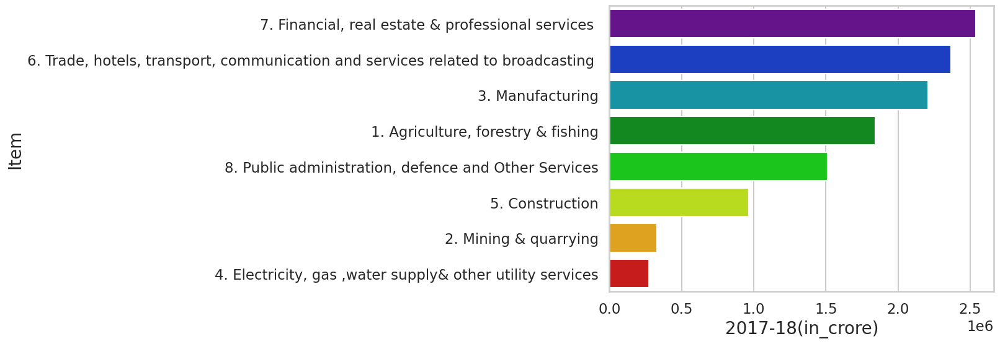

---------------------------------------------------------------------------------------------------------------------------------------------------------------------


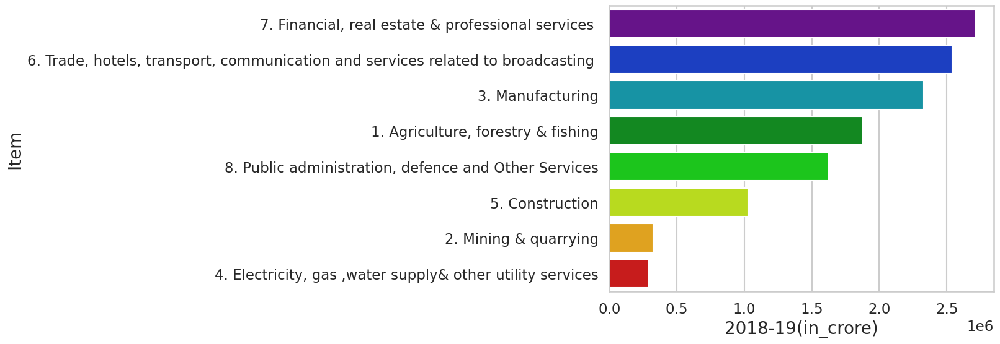

---------------------------------------------------------------------------------------------------------------------------------------------------------------------


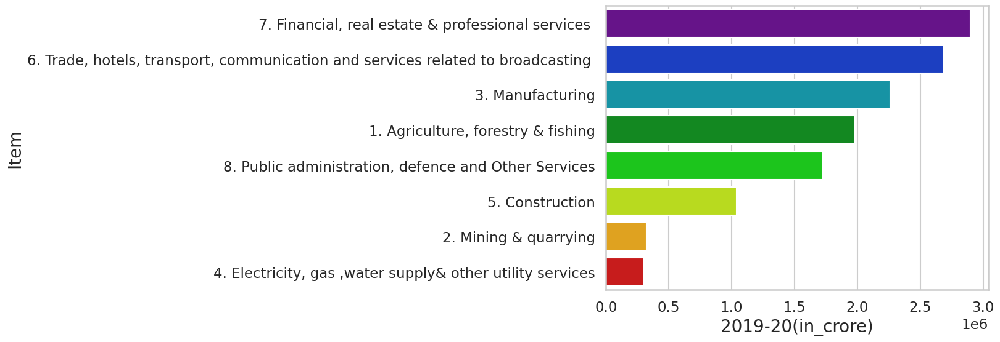

---------------------------------------------------------------------------------------------------------------------------------------------------------------------


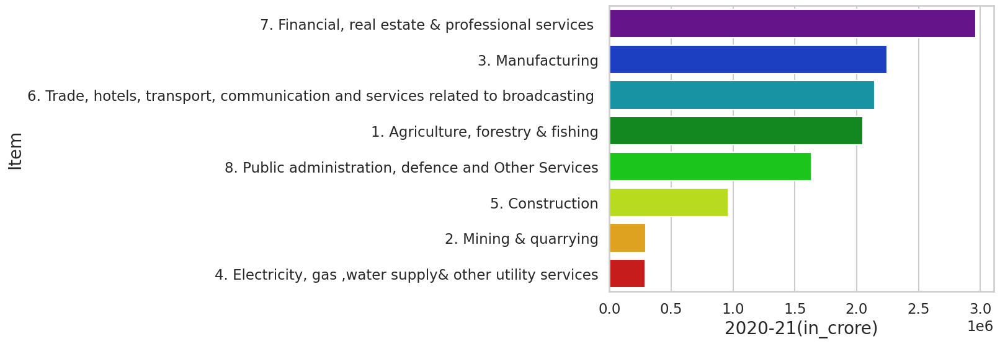

---------------------------------------------------------------------------------------------------------------------------------------------------------------------


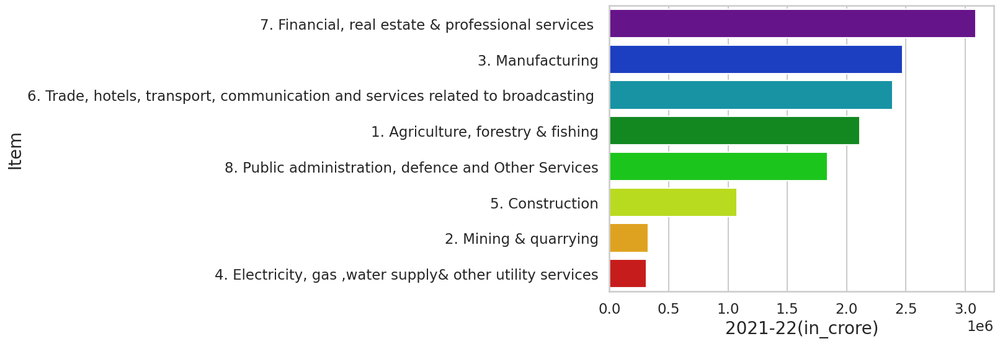

---------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [ ]:
print('-'*165)
for col in sdf1_value.columns[1:-1]:
    sns.set_style("whitegrid")
    sns.set_context('talk')
    plt.figure(figsize=(8,6))
    plt.rcParams["axes.labelsize"] = 20
    plt.rcParams['axes.titlesize'] = 22
    plt.rcParams['axes.titlepad'] = 30

    temp_df = sdf1_value.loc[:7,['Item',col]]
    temp_df['Index']=range(len(temp_df))
    temp_df=temp_df.set_index('Index',drop=True).sort_values(col,ascending=False)
    sns.barplot(y='Item',x=col,data=temp_df,palette='nipy_spectral')
    plt.show()
    print('-'*165)

##### **Year Wise pie chart**

In [ ]:
print('-'*170)
for year in sdf1_value[:8].columns.tolist()[1:-1]:
    fig = px.pie(sdf1_value[:8], 
                 values=year, 
                 names=sdf1_value[:8]['Item'].tolist(),
                 color_discrete_map={'Primary':'Green','Secondary':'cyan','Tertiry':'royalblue'},
                 title = 'Sub Sector wise GDP Contribution in {}'.format(year)) 
    fig.show()
    print('-'*170)

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


##### **Sector Wise GDP per years Pie charts**

In [ ]:
sec_sdf = sdf1_value.groupby(['sector']).sum()

In [ ]:
print('-'*170)
for year in sec_sdf.columns.tolist():
    fig = px.pie(sec_sdf, values=year, names=sec_sdf.index.tolist(),color_discrete_map={'Primary':'Green',
                                 'Secondary':'cyan',
                                 'Tertiry':'royalblue'} , title = 'Sector wise GDP Contribution in {}'.format(year) )
    fig.update_traces(pull=[0.1, 0, 0])
    fig.show()
    print('-'*170)

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------


##### **Stacked bar chart**

In [ ]:
temp_sec_sdf = sec_sdf.copy().T

In [ ]:
temp_sec_sdf.reset_index(drop=True,inplace=True)

In [ ]:
temp_sec_sdf['Duration'] = [ele[:-10] for ele in sec_sdf.columns.tolist()]

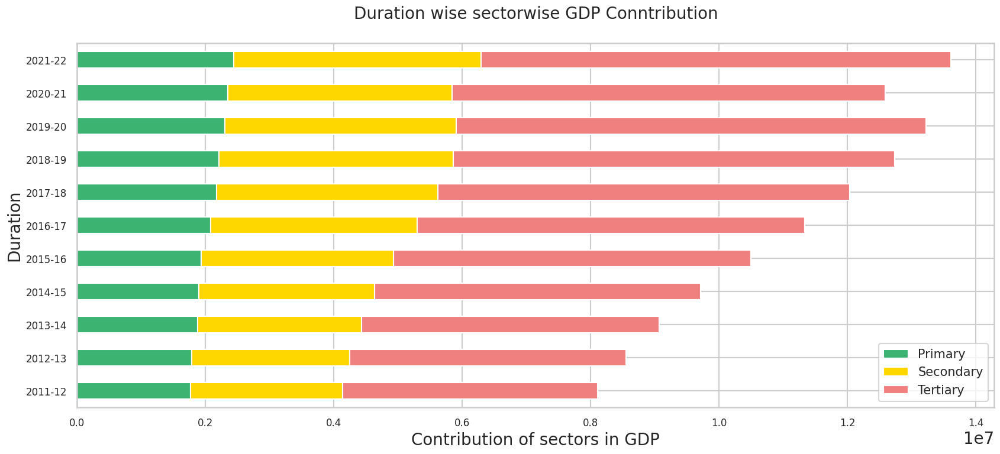

In [ ]:
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE =  20

plt.rc('font',size=BIGGER_SIZE)
plt.rc('axes',titlesize = BIGGER_SIZE)
plt.rc('axes',labelsize = BIGGER_SIZE)
plt.rc('xtick',labelsize = BIGGER_SIZE)
plt.rc('ytick',labelsize = BIGGER_SIZE)
plt.rc('legend',fontsize = BIGGER_SIZE)
plt.rc('figure',titlesize = BIGGER_SIZE)

temp_sec_sdf[['Duration','Primary','Secondary','Tertiary']].set_index('Duration').plot(kind='barh',color=  ['#3CB371' , '#FFD700','#F08080' ] ,stacked = True , figsize = (20,8))
  
plt.xlabel('Contribution of sectors in GDP')
plt.ylabel('Duration')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Duration wise sectorwise GDP Conntribution')
plt.legend(loc='best',fontsize=15)
plt.show()

##### **Line chart of sectors**

In [ ]:
temp1_sec_sdf = temp_sec_sdf.copy()
temp1_sec_sdf['Date'] = ['2012-03-31','2013-03-31','2014-03-31','2015-03-31','2016-03-31','2017-03-31','2018-03-31','2019-03-31','2020-03-31','2021-03-31','2022-03-31']

In [ ]:
fig = px.line(temp1_sec_sdf, x='Date', y=["Primary","Secondary",'Tertiary'],markers = True,title="Sector's trend over years")
fig.show()

##### **Line chart of Sub sector**

In [ ]:
sdf2_value = sdf1_value.copy().T

In [ ]:
sdf2_value.columns= sdf2_value.loc['Item'].tolist()
sdf2_value.drop(['Item' , 'sector'],axis = 0, inplace = True)
sdf2_value['Date'] = ['2012-03-31','2013-03-31','2014-03-31','2015-03-31','2016-03-31','2017-03-31','2018-03-31','2019-03-31','2020-03-31','2021-03-31','2022-03-31']

In [ ]:
sdf2_value

,"1. Agriculture, forestry & fishing",2. Mining & quarrying,3. Manufacturing,"4. Electricity, gas ,water supply& other utility services",5. Construction,"6. Trade, hotels, transport, communication and services related to broadcasting","7. Financial, real estate & professional services","8. Public administration, defence and Other Services",Total GDP,Date
2011-12(in_crore),1501946.09,261035.35,1409985.25,186668.0,777334.46,1413117.06,1530878.64,1025981.79,8106946.66,2012-03-31
2012-13(in_crore),1524288.51,262608.64,1486874.11,191634.99,780050.1,1551142.93,1680031.47,1069646.34,8546277.09,2013-03-31
2013-14(in_crore),1609198.39,263105.96,1560708.77,199601.01,800770.88,1652061.67,1867406.69,1110793.56,9063646.94,2014-03-31
2014-15(in_crore),1605714.25,288685.45,1683936.7,214046.99,835228.62,1807690.04,2073714.43,1203115.16,9712131.7,2015-03-31
2015-16(in_crore),1616145.93,317973.8,1903849.59,224158.0,865334.94,1992823.9,2294784.47,1276797.58,10491868.2,2016-03-31
2016-17(in_crore),1726003.84,349247.72,2054764.34,246497.01,916444.53,2146378.64,2492966.55,1395982.3,11328284.94,2017-03-31
2017-18(in_crore),1840022.89,329612.05,2209427.76,272650.02,964305.67,2368419.4,2537190.26,1512542.46,12034170.51,2018-03-31
2018-19(in_crore),1878598.36,326816.57,2328992.21,294147.0,1026789.19,2538757.28,2714221.72,1625477.46,12733799.78,2019-03-31
2019-20(in_crore),1982302.91,321766.38,2261293.87,300674.92,1038679.79,2689725.81,2897393.39,1727638.54,13219475.59,2020-03-31
2020-21(in_crore),2048031.89,294024.29,2247740.01,289771.22,962835.39,2147679.34,2961910.44,1633080.72,12585073.32,2021-03-31


In [ ]:
fig = px.line(sdf2_value, x='Date', y= sdf2_value.loc[:,['Total GDP']].columns.tolist(), markers = True, title="India's trend over years" )
fig.show()

In [ ]:
fig = px.line(sdf2_value, x='Date', y= sdf2_value.columns.tolist()[0:7] , markers = True, title="Sub-sector's trend over years")
fig.show()

##### **GSDP (per)**

In [ ]:
m_avg_sdf = sdf1_per.T.loc['2011-12(in_per)':'2021-22(in_per)',:8]
m_avg_sdf=m_avg_sdf.rolling(window=2).mean()
m_avg_sdf=m_avg_sdf.iloc[1:]
m_avg_sdf=m_avg_sdf.T
m_avg_sdf['Sector'] = sdf1_per['Item'].tolist()

In [ ]:
m_avg_sdf.head()

,2012-13(in_per),2013-14(in_per),2014-15(in_per),2015-16(in_per),2016-17(in_per),2017-18(in_per),2018-19(in_per),2019-20(in_per),2020-21(in_per),2021-22(in_per),Sector
0,13.980000,11.615,2.820000,15.400000,26.605000,18.105000,15.660,17.340000,12.535000,22.824999,"1. Agriculture, forestry & fishing"
1,1.280000,19.125,39.035000,39.215000,9.310001,-11.634999,-5.395,-20.900000,6.790001,64.560003,2. Mining & quarrying
2,21.309999,25.760,41.884998,42.124998,30.959999,26.179999,5.450,-7.065001,25.985001,90.520000,3. Manufacturing
3,13.670000,22.835,23.980000,29.470000,41.199999,36.969999,20.155,-2.270001,8.620000,52.935002,"4. Electricity, gas ,water supply& other utili..."
4,6.130000,14.170,15.845000,19.135000,22.475000,23.445000,15.250,-13.229998,23.740002,61.260000,5. Construction


In [ ]:
gsdp_sdf = m_avg_sdf.append(m_avg_sdf.iloc[0:,1:],sort=False)
gsdp_sdf.loc[np.isnan(gsdp_sdf['2012-13(in_per)']),['2012-13(in_per)']]=m_avg_sdf['2013-14(in_per)']
years = gsdp_sdf.columns[1:10]

for year in years:
    gsdp_sdf = gsdp_sdf.append(gsdp_sdf.iloc[0:9,1:],sort=False)
    gsdp_sdf.loc[np.isnan(gsdp_sdf['2012-13(in_per)']),['2012-13(in_per)']]=m_avg_sdf[year]
gsdp_sdf.drop_duplicates(keep = 'first' , inplace = True)

In [ ]:
gsdp_sdf = gsdp_sdf.iloc[0 : , 0::10]
gsdp_sdf.columns=['Rolling_Average','Sector'] 
gsdp_sdf['Duration']=[ '2012-13' for i in range(len(gsdp_sdf))]
gsdp_sdf.iloc[9:,2]='2013-14'
gsdp_sdf.iloc[18:,2]='2014-15'
gsdp_sdf.iloc[27:,2]='2015-16'
gsdp_sdf.iloc[36:,2]='2016-17'
gsdp_sdf.iloc[45:,2]='2017-18'
gsdp_sdf.iloc[54:,2]='2018-19'
gsdp_sdf.iloc[63:,2]='2019-20'
gsdp_sdf.iloc[72:,2]='2020-21'
gsdp_sdf.iloc[81:,2]='2021-22'
gsdp_sdf['Rolling_Average']=gsdp_sdf['Rolling_Average'].apply(lambda x:round(x,2)) 

In [ ]:
gsdp_sdf

,Rolling_Average,Sector,Duration
0,13.98,"1. Agriculture, forestry & fishing",2012-13
1,1.28,2. Mining & quarrying,2012-13
2,21.31,3. Manufacturing,2012-13
3,13.67,"4. Electricity, gas ,water supply& other utili...",2012-13
4,6.13,5. Construction,2012-13
...,...,...,...
4,61.26,5. Construction,2021-22
5,99.42,"6. Trade, hotels, transport, communication and...",2021-22
6,93.01,"7. Financial, real estate & professional servi...",2021-22
7,71.11,"8. Public administration, defence and Other Se...",2021-22


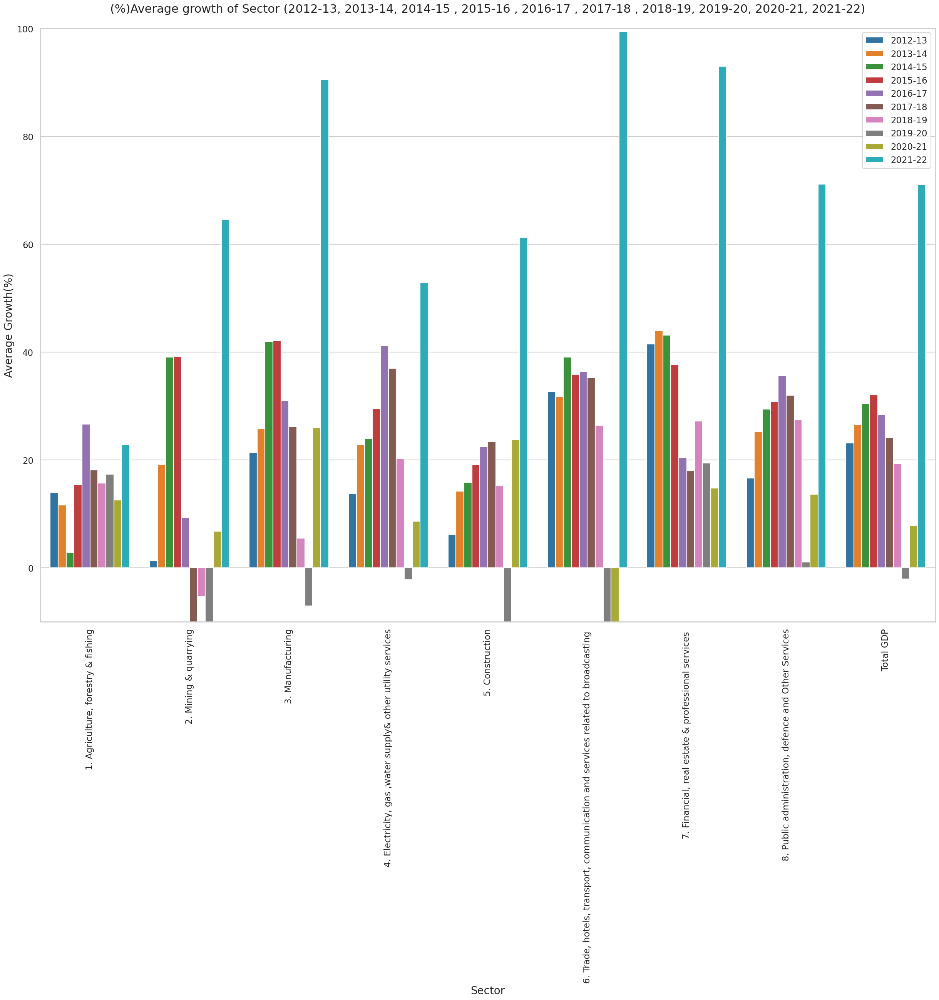

In [ ]:
sns.set_style('whitegrid')
sns.set_context('talk')
plt.figure(figsize=(30,20))
plt.rcParams["axes.labelsize"] = 20
plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.titlepad'] = 30

sns.barplot(x='Sector',y='Rolling_Average',hue='Duration',data=gsdp_sdf,palette='tab10')
plt.xticks(rotation=90)
plt.xlabel('Sector')
plt.ylabel('Average Growth(%)')
plt.title("(%)Average growth of Sector"' '"(2012-13, 2013-14, 2014-15 , 2015-16 , 2016-17 , 2017-18 , 2018-19, 2019-20, 2020-21, 2021-22)")
plt.ylim(top=100)
plt.ylim(bottom=-10)
plt.legend(loc=0)
plt.show()

In [ ]:
temp_avg = m_avg_sdf.T[:10]
temp_avg.columns = m_avg_sdf.Sector.tolist()[:9]

In [ ]:
temp_avg['Date'] = ['2013-03-31','2014-03-31','2015-03-31','2016-03-31','2017-03-31','2018-03-31','2019-03-31','2020-03-31','2021-03-31','2022-03-31']

In [ ]:
temp_avg

,"1. Agriculture, forestry & fishing",2. Mining & quarrying,3. Manufacturing,"4. Electricity, gas ,water supply& other utility services",5. Construction,"6. Trade, hotels, transport, communication and services related to broadcasting","7. Financial, real estate & professional services","8. Public administration, defence and Other Services",Total GDP,Date
2012-13(in_per),13.98,1.28,21.309999,13.67,6.13,32.63,41.449999,16.645,23.094999,2013-03-31
2013-14(in_per),11.615,19.125,25.76,22.835,14.17,31.749999,43.969999,25.24,26.539999,2014-03-31
2014-15(in_per),2.82,39.035,41.884998,23.98,15.845,39.039999,43.120001,29.434999,30.42,2015-03-31
2015-16(in_per),15.4,39.215,42.124998,29.47,19.135,35.855,37.585001,30.849998,32.040001,2016-03-31
2016-17(in_per),26.605,9.310001,30.959999,41.199999,22.475,36.385001,20.395,35.654999,28.420001,2017-03-31
2017-18(in_per),18.105,-11.634999,26.179999,36.969999,23.445,35.25,17.985,31.955,24.100001,2018-03-31
2018-19(in_per),15.66,-5.395,5.45,20.155,15.25,26.384999,27.165,27.41,19.305001,2019-03-31
2019-20(in_per),17.34,-20.9,-7.065001,-2.270001,-13.229998,-29.180001,19.400001,1.04,-2.11,2020-03-31
2020-21(in_per),12.535,6.790001,25.985001,8.62,23.740002,-13.380001,14.785,13.615001,7.775,2021-03-31
2021-22(in_per),22.824999,64.560003,90.52,52.935002,61.26,99.419998,93.009999,71.110003,71.039999,2022-03-31


In [ ]:
fig = px.line(temp_avg, x='Date', y= temp_avg.loc[:,['Total GDP']].columns.tolist(), markers = True, title="India's average growth rate" )
fig.show()

In [ ]:
fig = px.line(temp_avg, x='Date', y= temp_avg.iloc[:,:8].columns.tolist(), markers = True, title= "Sub-sector's average growth rate")
fig.show()

##### **Quater Wise analysis**

In [ ]:
qurt_sdf = sdf_per.T
qurt_sdf.columns = sdf_per['Item'].tolist()[:9]
qurt_sdf.drop(['Item'],axis=0,inplace=True)
m_avg1_sdf= qurt_sdf.rolling(window=2).mean()
m_avg1_sdf=m_avg1_sdf.iloc[1:]

m_avg1_sdf['Date'] = [
    '2012-09-30','2012-12-31','2013-03-31',
    '2013-06-30','2013-09-30','2013-12-31','2014-03-31',
    '2014-06-30','2014-09-30','2014-12-31','2015-03-31',
    '2015-06-30','2015-09-30','2015-12-31','2016-03-31',
    '2016-06-30','2016-09-30','2016-12-31','2017-03-31',
    '2017-06-30','2017-09-30','2017-12-31','2018-03-31',
    '2018-06-30','2018-09-30','2018-12-31','2019-03-31',
    '2019-06-30','2019-09-30','2019-12-31','2020-03-31',
    '2020-06-30','2020-09-30','2020-12-31','2021-03-31',
    '2021-06-30','2021-09-30','2021-12-31','2022-03-31',
    '2022-06-30'

]

In [ ]:
fig = px.line(m_avg1_sdf, x='Date', y= m_avg1_sdf.loc[:,['Total GDP']].columns.tolist(), markers = True, title= 'Quater wise average growth of India')
fig.show()

In [ ]:
fig = px.line(m_avg1_sdf, x='Date', y= m_avg1_sdf.iloc[:,:8].columns.tolist(), markers = True, title='Quater Wise average growth of sub-sectors of India')
fig.show()

##### **Correlation**

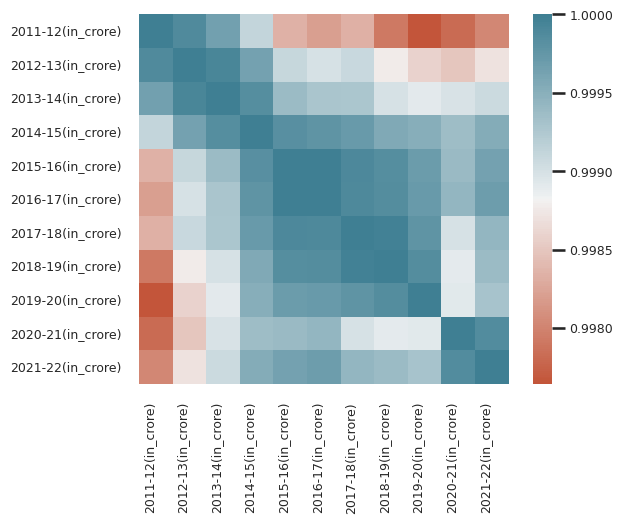

In [ ]:
ax = sns.heatmap(sdf1_value.corr(),
                 square=True, 
                 cmap=sns.diverging_palette(20, 220, n=200))

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='right'
)

plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=9)
plt.show()

In [ ]:
sdf1_value.corr()

,2011-12(in_crore),2012-13(in_crore),2013-14(in_crore),2014-15(in_crore),2015-16(in_crore),2016-17(in_crore),2017-18(in_crore),2018-19(in_crore),2019-20(in_crore),2020-21(in_crore),2021-22(in_crore)
2011-12(in_crore),1.000000,0.999871,0.999649,0.999125,0.998348,0.998206,0.998332,0.997918,0.997642,0.997812,0.998025
2012-13(in_crore),0.999871,1.000000,0.999922,0.999646,0.999098,0.998988,0.999089,0.998773,0.998588,0.998497,0.998715
2013-14(in_crore),0.999649,0.999922,1.000000,0.999840,0.999378,0.999287,0.999269,0.998989,0.998914,0.998979,0.999063
2014-15(in_crore),0.999125,0.999646,0.999840,1.000000,0.999825,0.999782,0.999706,0.999554,0.999513,0.999369,0.999530
2015-16(in_crore),0.998348,0.999098,0.999378,0.999825,1.000000,0.999993,0.999898,0.999842,0.999694,0.999389,0.999642
2016-17(in_crore),0.998206,0.998988,0.999287,0.999782,0.999993,1.000000,0.999886,0.999848,0.999714,0.999432,0.999690
2017-18(in_crore),0.998332,0.999089,0.999269,0.999706,0.999898,0.999886,1.000000,0.999966,0.999781,0.998994,0.999424
2018-19(in_crore),0.997918,0.998773,0.998989,0.999554,0.999842,0.999848,0.999966,1.000000,0.999851,0.998896,0.999384
2019-20(in_crore),0.997642,0.998588,0.998914,0.999513,0.999694,0.999714,0.999781,0.999851,1.000000,0.998916,0.999301
2020-21(in_crore),0.997812,0.998497,0.998979,0.999369,0.999389,0.999432,0.998994,0.998896,0.998916,1.000000,0.999865


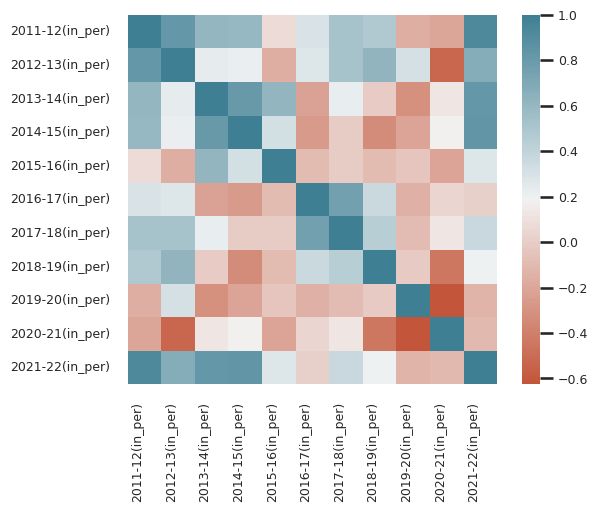

In [ ]:
ax = sns.heatmap(sdf1_per.corr(),
                 square=True, 
                 cmap=sns.diverging_palette(20, 220, n=200))

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='right'
)

plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=9)
plt.show()

In [ ]:
sdf1_per.corr()

,2011-12(in_per),2012-13(in_per),2013-14(in_per),2014-15(in_per),2015-16(in_per),2016-17(in_per),2017-18(in_per),2018-19(in_per),2019-20(in_per),2020-21(in_per),2021-22(in_per)
2011-12(in_per),1.000000,0.821538,0.601797,0.597906,0.072457,0.287612,0.526210,0.483360,-0.169157,-0.205976,0.921027
2012-13(in_per),0.821538,1.000000,0.231439,0.216015,-0.164429,0.273070,0.528052,0.624811,0.309133,-0.532528,0.671191
2013-14(in_per),0.601797,0.231439,1.000000,0.805275,0.616073,-0.222399,0.225398,-0.010705,-0.309538,0.124406,0.822857
2014-15(in_per),0.597906,0.216015,0.805275,1.000000,0.323509,-0.254024,-0.001946,-0.336068,-0.212369,0.175532,0.829770
2015-16(in_per),0.072457,-0.164429,0.616073,0.323509,1.000000,-0.096112,-0.001204,-0.093645,-0.042288,-0.212429,0.269224
2016-17(in_per),0.287612,0.273070,-0.222399,-0.254024,-0.096112,1.000000,0.761462,0.360292,-0.149773,0.038203,0.012742
2017-18(in_per),0.526210,0.528052,0.225398,-0.001946,-0.001204,0.761462,1.000000,0.442787,-0.089426,0.118805,0.373318
2018-19(in_per),0.483360,0.624811,-0.010705,-0.336068,-0.093645,0.360292,0.442787,1.000000,-0.018333,-0.448111,0.200827
2019-20(in_per),-0.169157,0.309133,-0.309538,-0.212369,-0.042288,-0.149773,-0.089426,-0.018333,1.000000,-0.626110,-0.135746
2020-21(in_per),-0.205976,-0.532528,0.124406,0.175532,-0.212429,0.038203,0.118805,-0.448111,-0.626110,1.000000,-0.110314


### **6) Prediction**

In [ ]:
X_sdf_value = sdf1_value.iloc[:,1:-2]
Y_sdf_value = sdf1_value.iloc[:,-2]

In [ ]:
Linear_regression(X_sdf_value,Y_sdf_value)

125943.94776811193

In [ ]:
Polynomial_regression(X_sdf_value,Y_sdf_value,2)

130874.00621307429

In [ ]:
X_sdf_per = sdf1_per.iloc[:,1:-2]
Y_sdf_per = sdf1_per.iloc[:,-2]

In [ ]:
nLinear_regression(X_sdf_per,Y_sdf_per)

31.854395

In [ ]:
Polynomial_regression(X_sdf_per,Y_sdf_per,2)

18.165548